In [37]:
import os
import sys
import cv2
import random
import itertools
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pyplot import plot
    
from statistics import mean
from collections import namedtuple
# %matplotlib inline

In [38]:
GREEN = (0, 255, 0)
BLUR = (255, 0, 0)
RED = (0, 0, 255)

def show(img):
    """
    show rgb image
    """
    # frameon - без осей прямоугольник
    ax = plt.axes([0,0,4,4], frameon=False)
    ax.set_axis_off()
    # показывает растровое 2d изображение
    #cvtColor - преобразовать цвет в другую гамму . А еще без нее рисовать не получсется, ибо во float не конвертируется
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

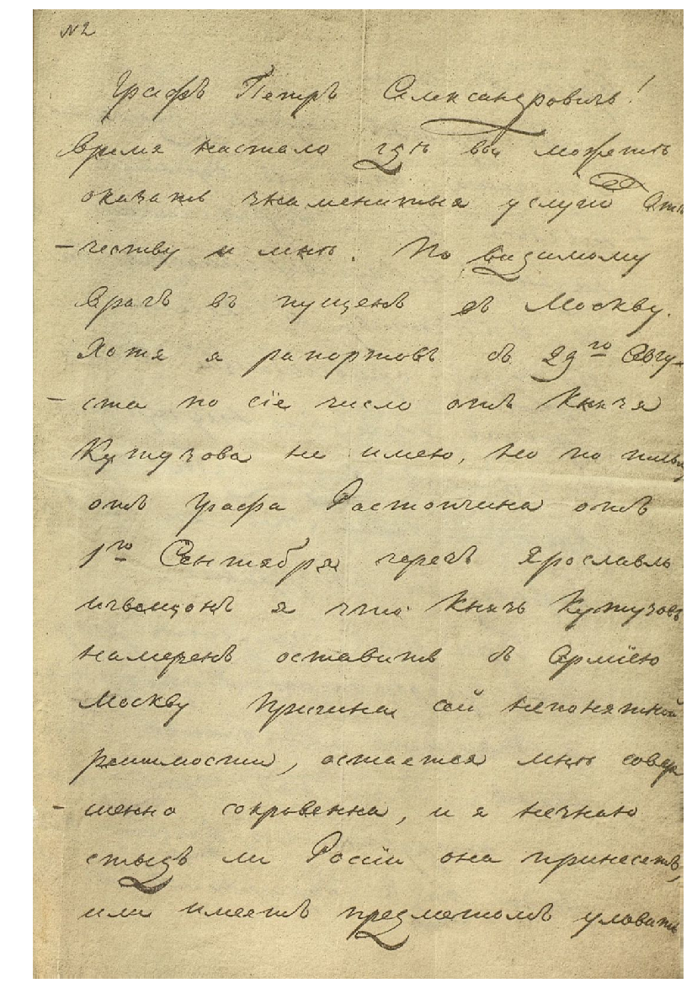

In [39]:
path_letter = r'1\\1_1.jpg'
img_let = cv2.imread(path_letter)
show(img_let)


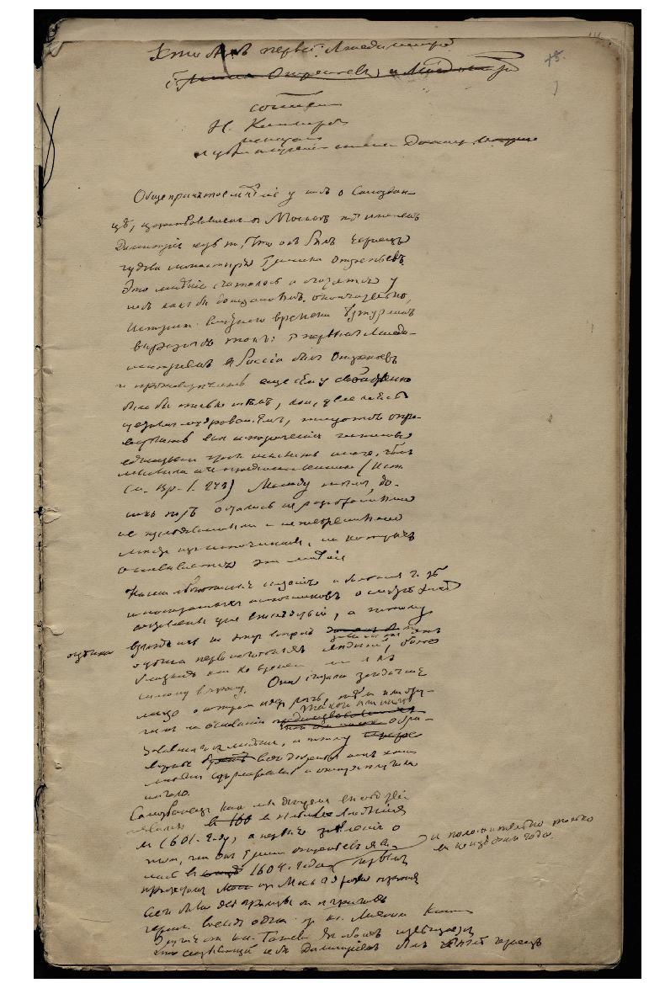

In [41]:
path_l2 = r'1\\2.jpg'
img_l2 = cv2.imread(path_l2)
show(img_l2)

In [42]:
def show_gray(img):
    """
    show grayscale image
    """
    ax = plt.axes([0,0,4,4], frameon=False)
    ax.set_axis_off()
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.show()

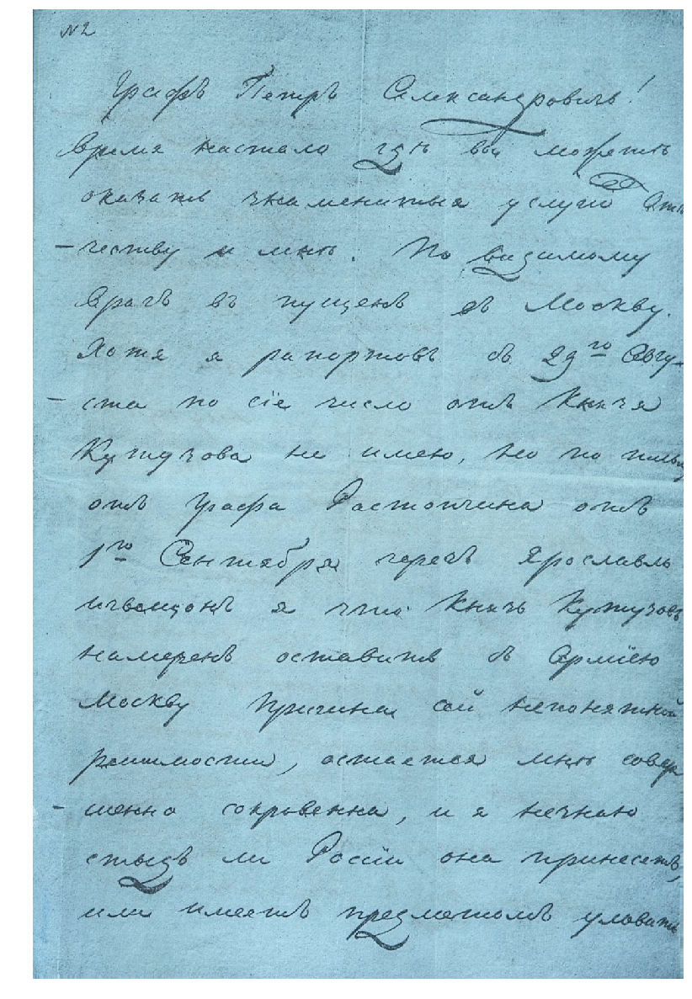

In [43]:
show_gray(img_let)

In [44]:
def find_text_contours(image):
    """
    Find areas with text on image
    """
    img = image.copy()
    # Если не серое изображение, то выдает 3 параметра - последний - каналы - стандартно 3 для rgb
    n, m,_= img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)[1]
    # gray = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)[1]
    show_gray(gray)
    # Побитовые операции с изображениями , чтобы не было смешения цветов? ХЗ
    binary = cv2.bitwise_not(gray)
    show_gray(binary)
    # выдает внешние - самые старшие контуры - причем только граничные точки прямоугольника
    contours, hierarchy  = cv2.findContours(binary,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    text_contours = []
    # Добавили в границы контура , если выполнено условие на ширину и длину - текст не мб шире страницы и меньше половины страницы 
    # (брехня, мне это не оч подходит) и если он меньше 12й части страницы или больше ее половины - короче данные параметры 
    # самой подбирать 
    # Интересно, а что он выделит, если на них забить вообще
    
    for contour in contours:
        (x, y, w, h) = cv2.boundingRect(contour)
        if m > w > m / 2 and n / 2 > h > n / 12:
            text_contours.append([x, y, w, h])
    text_contours.sort(key = lambda x : x[1])
    return text_contours

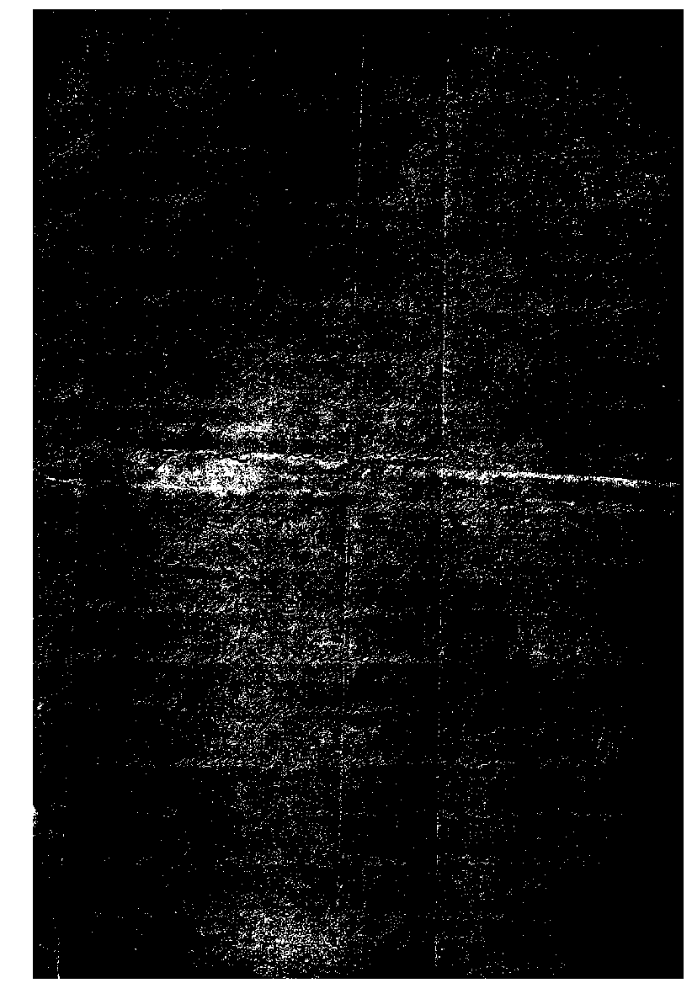

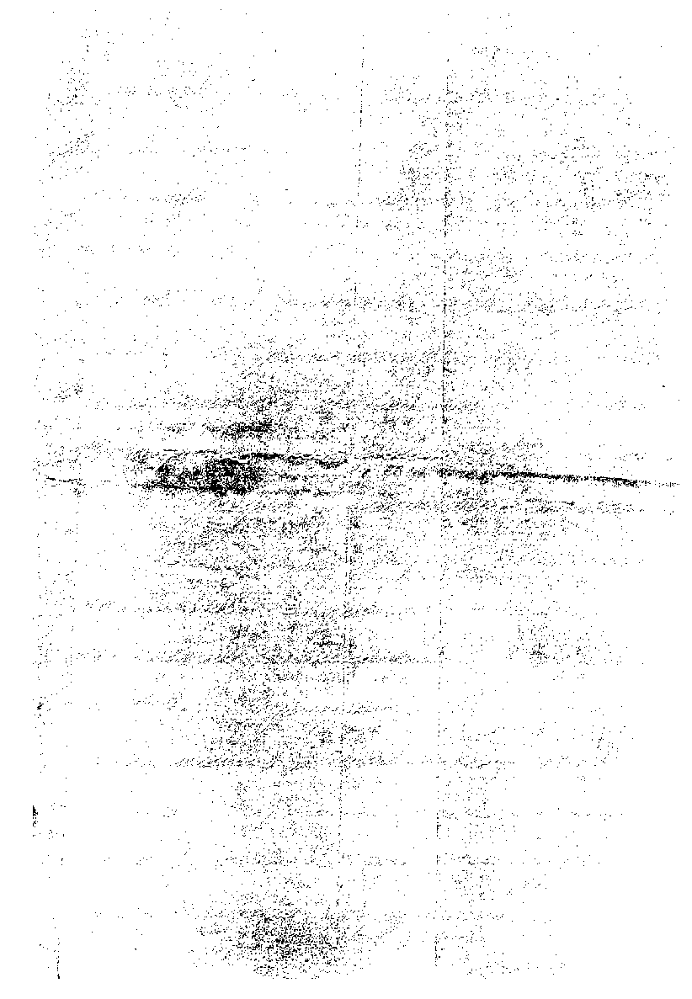

In [45]:
contours_let = find_text_contours(img_let)

In [18]:
def draw_contour_on_image(image, contours):
    """
    Draw contours finded with function "find_text_contours"
    """
    img = image.copy()
    for cnt in contours:
        x, y, w, h = cnt
        cv2.rectangle(img, (x, y), (x + w, y + h), GREEN, 4)
    show(img)

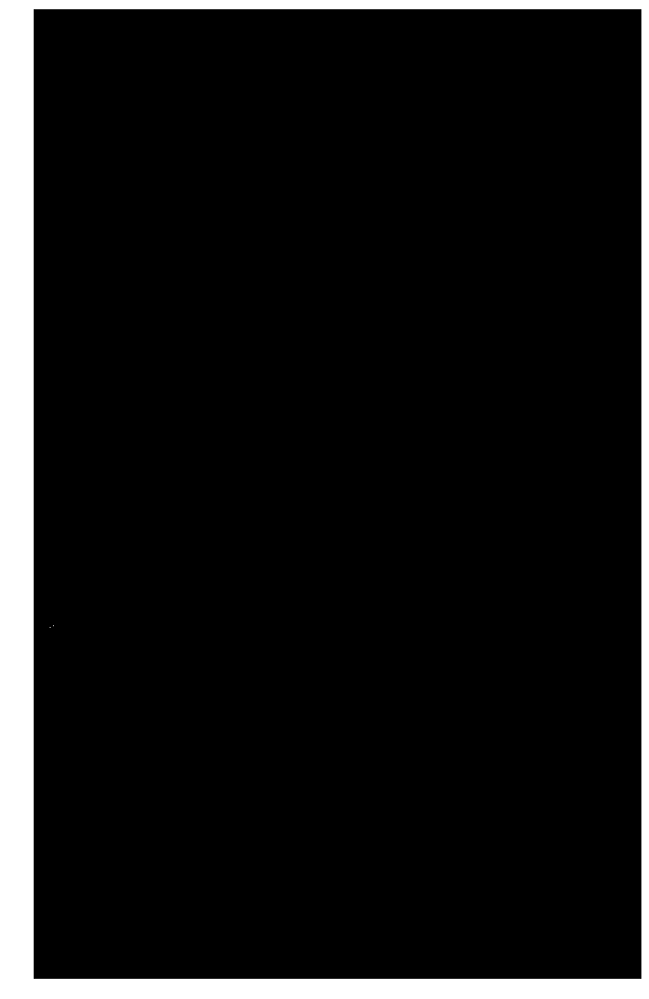

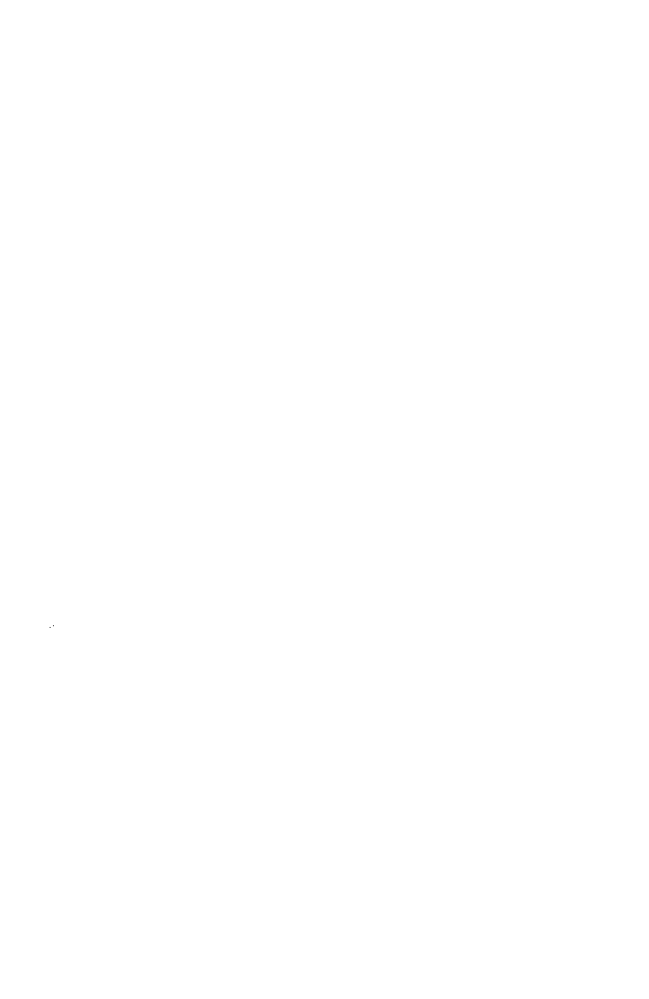

In [46]:
contours_l2 = find_text_contours(img_l2)

In [47]:
contours_l2

[]

### Он просто ничего не нашел - клево !

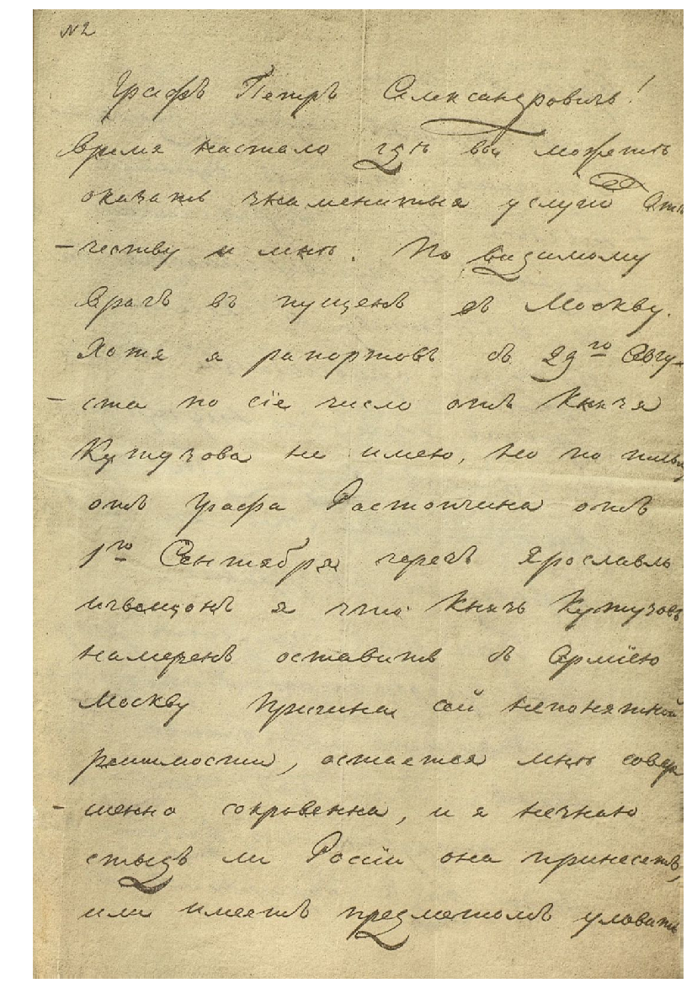

In [19]:
draw_contour_on_image(img_let, contours_let)

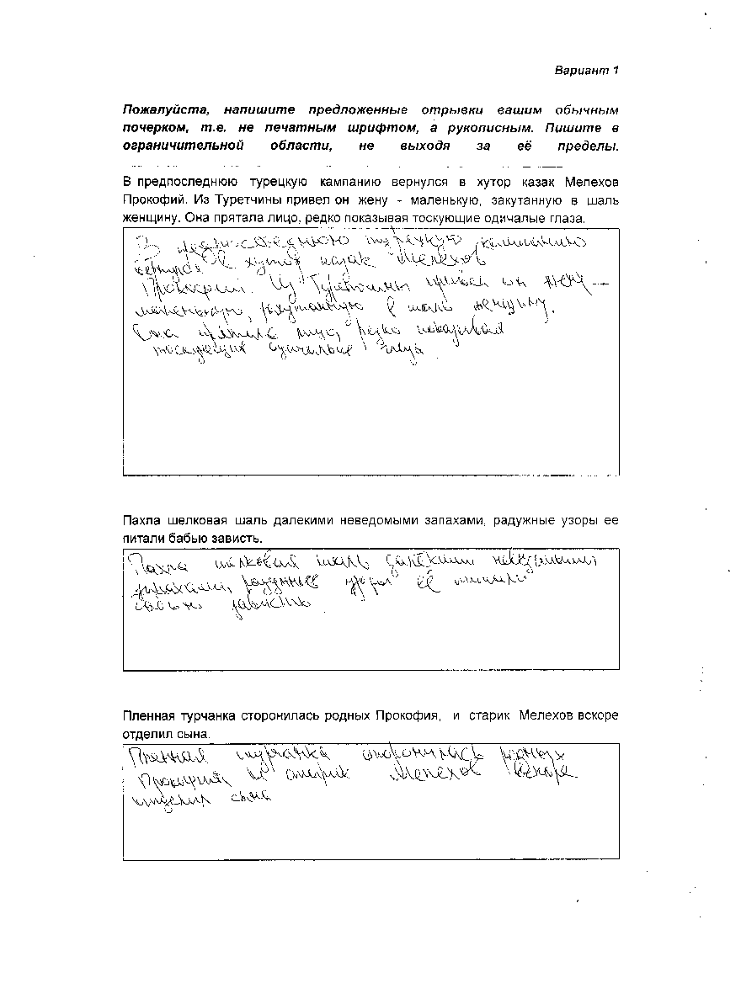

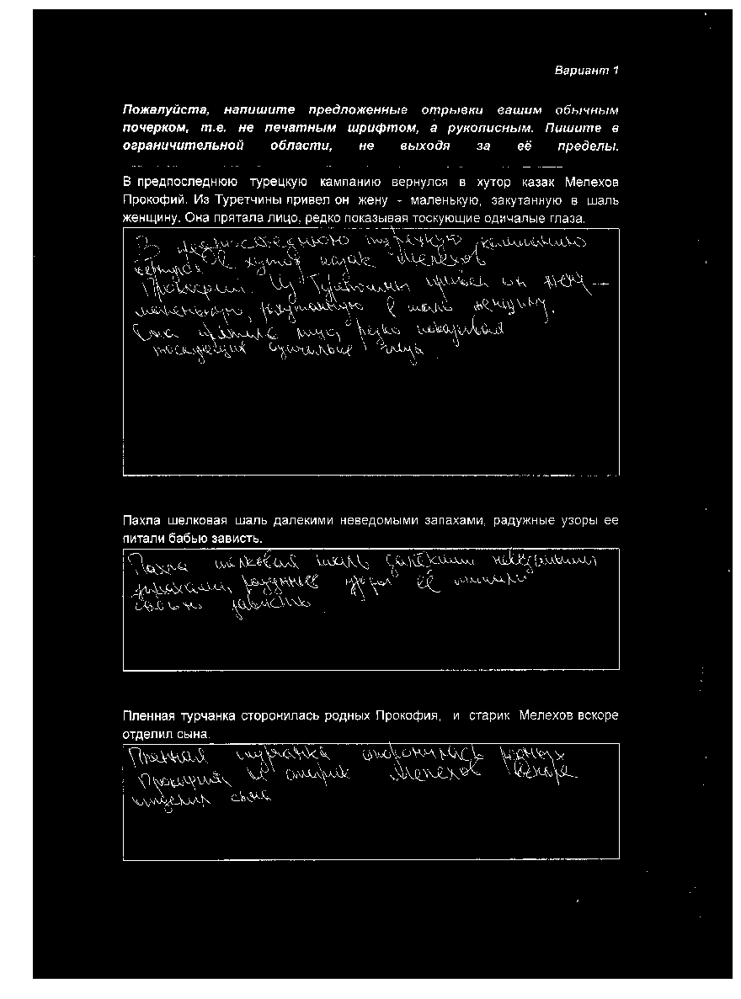

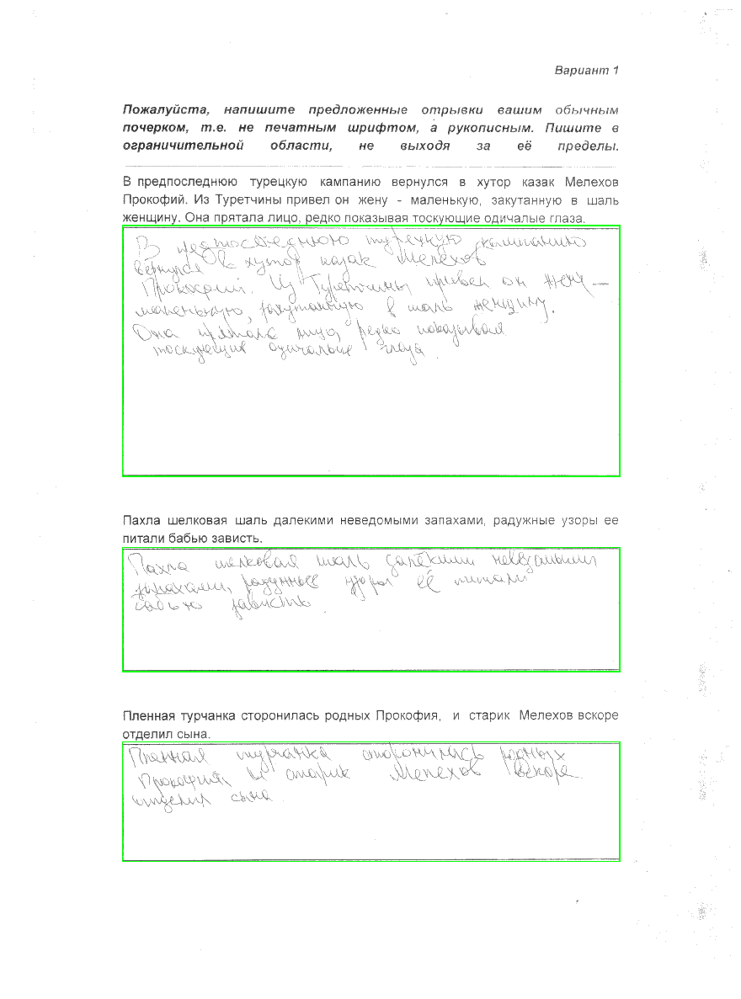

In [20]:
path_1_1 = 'dataset\\variant_1\\1_1.png'
img_1_1 = cv2.imread(path_1_1)
contours_1_1 = find_text_contours(img_1_1)
draw_contour_on_image(img_1_1, contours_1_1)

## Наверное, я могу забить на определение контуров в целом или обрезать прямо по ним картинку

In [21]:
def get_text_area(image, contour, padding = 20):
    """
    Cut text areas from image with contours find in "find_text_contours"
    """
    x, y, w, h = contour
    img = image[y + padding +10  : y + h - padding - 10, x + padding + 10 : x + w - padding - 80]
    return cv2.copyMakeBorder(img, 5, 5, 5, 5, cv2.BORDER_CONSTANT, value=[255,255,255] )

In [23]:
get_text_area(img_let, contours_let )

ValueError: not enough values to unpack (expected 4, got 0)

### Поставить контуром размеры картинки. 
### Пока могу только высоту , ширину заюзать

In [25]:
contours_1_1

[[324, 781, 1796, 909], [323, 1946, 1797, 450], [323, 2649, 1797, 433]]

In [27]:
get_text_area(img_1_1, contours_1_1[0] )

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [28]:
def otsu_binarization(image):
    """
    Otsu image binarization
    """
    img = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)
    img = cv2.threshold(img, 230, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    return img

In [29]:
otsu_binarization(img_let)

array([[  0,   0, 255, ..., 255, 255, 255],
       [  0,   0,   0, ...,   0, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ...,   0, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ...,   0,   0,   0]], dtype=uint8)

In [34]:

def get_chunks(image, channels = 1):
    """
    Split image on chunks, each chunk is 5 percent of image width
    return: array with y-coordinates
    """
    if (channels == 3):
        n, m, _ = image.shape
    else:
        n, m, _ = image.shape
    return np.arange(0, m + 1, m // 20)

In [35]:
get_chunks(img_let)

array([   0,   55,  110,  165,  220,  275,  330,  385,  440,  495,  550,
        605,  660,  715,  770,  825,  880,  935,  990, 1045, 1100])

In [36]:
def median_smooth(signal, kernel_size = 5):
    """
    Smooth signal
    """
    smooth_signal = []
    for i, val in enumerate(signal[:-kernel_size]):
        smooth_signal.append(sum(signal[i: i + kernel_size]) / kernel_size)
        #smooth_signal.append(np.median(signal[i: i + kernel_size]))
    return np.array(smooth_signal)

### ! Понять, как организованы изображения в памяти компьютера
### ! Осознать попиксельно , что происходит

In [103]:
def build_hists(image):
    """
    Build hist to each chunk
    """
    hists = []
    chunks = get_chunks(image)
    black_height = []
    white_height = []
    lines_count = []
    #i - номер итерации, val - значение массива chunks вплоть до предпоследнего элемента
    for i, val in enumerate(chunks[:-1]):
        chunk = image[:, val : chunks[i + 1]]
        hist = np.sum(1 - (chunk / 255), axis=1)
        current_black_height = 0
        current_white_height = 0
        count = 0
        # добавила второе [0], но мне кажется, что это неправильно
        is_zero = True
        for el in hist[0]:
            if round(el, 0) != 0:
                is_zero = False
        if is_zero == True:
        #if hist[0] == 0:
        #if hist[0][0] == 0:
            current_black_height += 1
        else:
            current_white_height += 1
            # добавила второе [0]
        for pix in hist[1:]:
            if pix[0] == 0:
                if current_black_height > 0:
                    current_black_height += 1
                else:
                    current_black_height += 1
                    white_height.append(current_white_height)
                    current_white_height = 0
            else:
                if current_white_height > 0:
                    current_white_height += 1
                else:
                    current_white_height += 1
                    black_height.append(current_black_height)
                    count += 1
                    current_black_height = 0
        lines_count.append(count)
        hists.append(hist)
    return hists, mean(black_height), mean(white_height), lines_count


In [79]:
chunks 

array([   0,  126,  252,  378,  504,  630,  756,  882, 1008, 1134, 1260,
       1386, 1512, 1638, 1764, 1890, 2016, 2142, 2268, 2394, 2520])

In [104]:
hists = []
chunks = get_chunks(img_1_1)
black_height = []
white_height = []
lines_count = []
for i, val in enumerate(chunks[:-1]):
    print('i: ' + str(i))
    print('val: ' + str(val))
    chunk = img_1_1[:, val : chunks[i + 1]]
    hist = np.sum(1 - (chunk / 255), axis=1)
    print(hist)
    print('-----')
    print(hist[1:])
    print('hist[0][0]')
    print(hist[0][0])
    print('hist[0]')
    print(hist[0])
        # добавила второе [0]
    for pix in hist[1:]:
        print('pix[0]')
        print(pix[0])
        print(pix)
            
    
    

i: 0
val: 0
[[0.  0.  0. ]
 [0.2 0.2 0.2]
 [0.4 0.4 0.4]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
-----
[[0.2 0.2 0.2]
 [0.4 0.4 0.4]
 [0.2 0.2 0.2]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]


[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pi

[[0.  0.  0. ]
 [0.  0.  0. ]
 [0.2 0.2 0.2]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
-----
[[0.  0.  0. ]
 [0.2 0.2 0.2]
 [0.  0.  0. ]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[[0.  0.  0. ]
 [0.2 0.2 0.2]
 [0.  0.  0. ]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
-----
[[0.2 0.2 0.2]
 [0.  0.  0. ]
 [0.  0.  0. ]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
12.627450980392158
[12.62745098 12.62745098 12.62745098]
pix[0]
22.490196078431378
[22.49019608 22.49019608 22.49019608]
pix[0]
27.792156862745113
[27.79215686 27.79215686 27.79215686]
pix[0]
30.24313725490198
[30.24313725 30.24313725 30.24313725]
pix[0]
29.294117647058833
[29.29411765 29.29411765 29.29411765]
pix[0]
23.839215686274517
[23.83921569 23.83921569 23.83921569]
pix[0]
19.596078431372554
[19.59607843 19.59607843 19.59607843]
pix[0]
18.490196078431378
[18.49019608 18.49019608 18.49019608]
pix[0]
18.800000000000004
[18.8 18.8 18.8]
pix[0]
17.239215686274513
[17.23921569 17.23921569 17.23921569]
pix[0]
17.690196078431374
[17.69019608 17.69019608 17.69019608]
pix[0]
17.5921568627451
[17.59215686 17.59215686 17.59215686]
pix[0]


[2.19607843 2.19607843 2.19607843]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.396078431372549
[2.39607843 2.39607843 2.39607843]
pix[0]
2.396078431372549
[2.39607843 2.39607843 2.39607843]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
2.3960784313725494
[2.39607843 2.39607843 2.39607843]
pix[0]
2.3960784313725494
[2.39607843 2.39607843 2.39607843]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
2.3960784313725494
[2.39607843 2.39607843 2.39607843]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
3.0
[3. 3. 3.]
pix[0]
2.5960784313725487
[2.59607843 2.59607843 2.59607843]
pix[0]
2.396078431372549
[2.39607843 2.39607843 2.39607843]
pix[0]
2.396078431372549
[2.39607843 2.39607843 2.39607843]
pix[0]
2.196078431372549
[2.1960

[3.19215686 3.19215686 3.19215686]
pix[0]
3.2980392156862743
[3.29803922 3.29803922 3.29803922]
pix[0]
3.6980392156862747
[3.69803922 3.69803922 3.69803922]
pix[0]
3.6431372549019603
[3.64313725 3.64313725 3.64313725]
pix[0]
3.8431372549019613
[3.84313725 3.84313725 3.84313725]
pix[0]
3.6980392156862747
[3.69803922 3.69803922 3.69803922]
pix[0]
3.345098039215686
[3.34509804 3.34509804 3.34509804]
pix[0]
3.698039215686274
[3.69803922 3.69803922 3.69803922]
pix[0]
3.6392156862745093
[3.63921569 3.63921569 3.63921569]
pix[0]
3.4941176470588236
[3.49411765 3.49411765 3.49411765]
pix[0]
3.6470588235294112
[3.64705882 3.64705882 3.64705882]
pix[0]
3.996078431372549
[3.99607843 3.99607843 3.99607843]
pix[0]
4.0
[4. 4. 4.]
pix[0]
3.7450980392156863
[3.74509804 3.74509804 3.74509804]
pix[0]
4.294117647058823
[4.29411765 4.29411765 4.29411765]
pix[0]
4.196078431372548
[4.19607843 4.19607843 4.19607843]
pix[0]
3.7450980392156863
[3.74509804 3.74509804 3.74509804]
pix[0]
3.498039215686274
[3.49803

[1.89803922 1.89803922 1.89803922]
pix[0]
1.8980392156862746
[1.89803922 1.89803922 1.89803922]
pix[0]
1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
2.1450980392156866
[2.14509804 2.14509804 2.14509804]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
2.2470588235294118
[2.24705882 2.24705882 2.24705882]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509

[2.29803922 2.29803922 2.29803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.0980392156862746
[2.09803922 2.09803922 2.09803922]
pix[0]
2.196078431372549
[2.19607843 2.19607843 2.19607843]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.

2.5999999999999996
[2.6 2.6 2.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
6.717647058823531
[6.71764706 6.71764706 6.71764706]
pix[0]
19.59607843137255
[19.59607843 19.59607843

1.9450980392156865
[1.94509804 1.94509804 1.94509804]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.145098039215686
[2.14509804 2.14509804 2.14509804]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
1.8470588235294119
[1.84705882 1.84705882 1.84705882]
pix[0]
1.8470588235294119
[1.84705882 1.84705882 1.84705882]
pix[0]
21.27843137254901
[21.27843137 21.27843137 21.27843137]
pix[0]
32.69803921568631
[32.69803922 32.69803922 32.69803922]
pix[0]
33.098039215686306
[33.09803922 33.09803922 33.09803922]
pix[0]
23.58039215686273
[23.58039216 23.58039216 23.58039216]
pix[0]
7.800000000000004
[7.8 7.8 7.8]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.

[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
-----
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
2.5999999999999996
[2.6 2.6 2.6]
pix[0]
24.12941176470586
[24.12941176 24.12941176 24.12941176]
pix[0]
42.72549019607846
[42.7254902 42.7254902 42.7254902]
pix[0]
53.53333333333334
[53.53333333 53.53333333 53.53333333]
pix[0]
58.18039215686275
[58.18039216 58.18039216 58.18039216]
pix[0]
56.52549019607841
[56.5254902 56.5254902 56.5254902]
pix[0]
52.28235294117646
[52.28235294 52.28235294 52.28235294]
pix[0]
50.4156862745098
[50.41568627 50.41568627 50.41568627]
pix[0]
49.278431372549015
[49.27843137 49.27843137 49.27843137]
pix[0]
48.

pix[0]
1.7999999999999996
[1.8 1.8 1.8]
pix[0]
1.6941176470588233
[1.69411765 1.69411765 1.69411765]
pix[0]
1.6941176470588233
[1.69411765 1.69411765 1.69411765]
pix[0]
1.2470588235294116
[1.24705882 1.24705882 1.24705882]
pix[0]
1.3999999999999997
[1.4 1.4 1.4]
pix[0]
1.0470588235294116
[1.04705882 1.04705882 1.04705882]
pix[0]
1.0941176470588234
[1.09411765 1.09411765 1.09411765]
pix[0]
1.3411764705882352
[1.34117647 1.34117647 1.34117647]
pix[0]
2.2470588235294118
[2.24705882 2.24705882 2.24705882]
pix[0]
1.6941176470588233
[1.69411765 1.69411765 1.69411765]
pix[0]
1.8941176470588232
[1.89411765 1.89411765 1.89411765]
pix[0]
1.4470588235294115
[1.44705882 1.44705882 1.44705882]
pix[0]
1.4470588235294115
[1.44705882 1.44705882 1.44705882]
pix[0]
1.5411764705882351
[1.54117647 1.54117647 1.54117647]
pix[0]
2.447058823529412
[2.44705882 2.44705882 2.44705882]
pix[0]
2.588235294117647
[2.58823529 2.58823529 2.58823529]
pix[0]
2.141176470588235
[2.14117647 2.14117647 2.14117647]
pix[0]
2

8.937254901960785
[8.9372549 8.9372549 8.9372549]
pix[0]
8.427450980392157
[8.42745098 8.42745098 8.42745098]
pix[0]
8.3921568627451
[8.39215686 8.39215686 8.39215686]
pix[0]
7.435294117647061
[7.43529412 7.43529412 7.43529412]
pix[0]
7.647058823529415
[7.64705882 7.64705882 7.64705882]
pix[0]
7.725490196078434
[7.7254902 7.7254902 7.7254902]
pix[0]
8.886274509803926
[8.88627451 8.88627451 8.88627451]
pix[0]
8.227450980392158
[8.22745098 8.22745098 8.22745098]
pix[0]
8.239215686274513
[8.23921569 8.23921569 8.23921569]
pix[0]
7.941176470588238
[7.94117647 7.94117647 7.94117647]
pix[0]
7.133333333333335
[7.13333333 7.13333333 7.13333333]
pix[0]
8.082352941176474
[8.08235294 8.08235294 8.08235294]
pix[0]
8.094117647058827
[8.09411765 8.09411765 8.09411765]
pix[0]
6.788235294117649
[6.78823529 6.78823529 6.78823529]
pix[0]
6.294117647058825
[6.29411765 6.29411765 6.29411765]
pix[0]
4.03529411764706
[4.03529412 4.03529412 4.03529412]
pix[0]
2.094117647058823
[2.09411765 2.09411765 2.094117

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[3.29803922 3.29803922 3.29803922]
pix[0]
3.2392156862745094
[3.23921569 3.23921569 3.23921569]
pix[0]
2.3921568627450975
[2.39215686 2.39215686 2.39215686]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
2.8352941176470585
[2.83529412 2.83529412 2.83529412]
pix[0]
5.74117647058

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
3.7333333333333334
[3.73333333 3.73333333 3.73333333]
pix[0]
7.443137254901959
[7.44313725 7.44313725 7.44313725]
pix[0]
10.89019607843137
[10.89019608 10.89019608 10.89019608]
pix[0]
12.188235294117643
[12.18823529 12.18823529 12.18823529]
pix[0]
10.733333333333333
[10.73333333 10.73333333 10.73333333]
pix[0]
8.192156862745097
[8.19215686 8.19215686 8.19215686]
pix[0]
7.043137254901961
[7.04313725 7.04313725 7.04313725]
pix[0]
5.996078431372549
[5.99607843 5.99607843 5.99607843]
pix[0]
7.090196078431373
[7.09019608 7.09019608 7.09019608]
pix[0]
15.380392156862742
[15.38039216 15.38039216 15.38039216]
pix[0]
18.788235294117648
[18.78823529 18.7

pix[0]
6.435294117647061
[6.43529412 6.43529412 6.43529412]
pix[0]
6.541176470588237
[6.54117647 6.54117647 6.54117647]
pix[0]
7.541176470588238
[7.54117647 7.54117647 7.54117647]
pix[0]
8.23921568627451
[8.23921569 8.23921569 8.23921569]
pix[0]
8.772549019607846
[8.77254902 8.77254902 8.77254902]
pix[0]
8.839215686274514
[8.83921569 8.83921569 8.83921569]
pix[0]
9.874509803921573
[9.8745098 9.8745098 9.8745098]
pix[0]
10.274509803921571
[10.2745098 10.2745098 10.2745098]
pix[0]
9.682352941176473
[9.68235294 9.68235294 9.68235294]
pix[0]
11.776470588235295
[11.77647059 11.77647059 11.77647059]
pix[0]
11.356862745098042
[11.35686275 11.35686275 11.35686275]
pix[0]
12.070588235294117
[12.07058824 12.07058824 12.07058824]
pix[0]
12.168627450980395
[12.16862745 12.16862745 12.16862745]
pix[0]
13.219607843137258
[13.21960784 13.21960784 13.21960784]
pix[0]
14.113725490196082
[14.11372549 14.11372549 14.11372549]
pix[0]
16.22352941176471
[16.22352941 16.22352941 16.22352941]
pix[0]
16.682352

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
2.141176470588235
[2.14117647 2.14117647 2.14117647]
pix[0]
4.082352941176471
[4.08235294 4.08235294 4.08235294]
pix[0]
4.43529411764706
[4.43529412 4.43529412 4.43529412]
pix[0]
4.63529411764706
[4.63529412 4.63529412 4.63529412]
pix[0]
5.494117647058824
[5.49411765 5.49411765 5.49411765]
pix[0]
5.188235294117648
[5.18823529 5.18823529 5.18823529]
pix[0]
5.23529411764706
[5.23529412 5.23529412 5.23529412]
pix[0]
4.9333333333333345
[4.93333333 4.93333333 4.93333333]
pix[0]
5.7921568627451
[5.79215686 5.7

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
52.57254901960788
[52.57254902 52.57254902 52.57254902]
pix[0]
77.0
[77. 77. 77.]
pix[0]
79.79999999999998
[79.8 79.8 79.8]
pix[0]
75.2901960784314
[75.29019608 75.29019608 75.29019608]
pix[0]
30.094117647058756
[30.09411765 30.09411765 30.09411765]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

18.29803921568627
[18.29803922 18.29803922 18.29803922]
pix[0]
19.345098039215678
[19.34509804 19.34509804 19.34509804]
pix[0]
16.87450980392157
[16.8745098 16.8745098 16.8745098]
pix[0]
13.176470588235293
[13.17647059 13.17647059 13.17647059]
pix[0]
12.082352941176474
[12.08235294 12.08235294 12.08235294]
pix[0]
9.541176470588237
[9.54117647 9.54117647 9.54117647]
pix[0]
7.7921568627451006
[7.79215686 7.79215686 7.79215686]
pix[0]
4.992156862745098
[4.99215686 4.99215686 4.99215686]
pix[0]
2.541176470588235
[2.54117647 2.54117647 2.54117647]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0


[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
4.600000000000001
[4.6 4.6 4.6]
pix[0]
54.839215686274606
[54.83921569 54.83921569 54.83921569]
pix[0]
75.8
[75.8 75.8 75.8]
pix[0]
75.6
[75.6 75.6 75.6]
pix[0]
43.68235294117651
[43.68235294 43.68235294 43.68235294]
pix[0]
7.400000000000004
[7.4 7.4 7.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]


[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
-----
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 

[28.13333333 28.13333333 28.13333333]
pix[0]
26.988235294117654
[26.98823529 26.98823529 26.98823529]
pix[0]
23.066666666666674
[23.06666667 23.06666667 23.06666667]
pix[0]
9.862745098039213
[9.8627451 9.8627451 9.8627451]
pix[0]
2.4980392156862745
[2.49803922 2.49803922 2.49803922]
pix[0]
2.0470588235294116
[2.04705882 2.04705882 2.04705882]
pix[0]
2.2980392156862743
[2.29803922 2.29803922 2.29803922]
pix[0]
2.1999999999999997
[2.2 2.2 2.2]
pix[0]
1.796078431372549
[1.79607843 1.79607843 1.79607843]
pix[0]
0.8470588235294118
[0.84705882 0.84705882 0.84705882]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 

3.5294117647058822
[3.52941176 3.52941176 3.52941176]
pix[0]
2.5882352941176467
[2.58823529 2.58823529 2.58823529]
pix[0]
2.188235294117647
[2.18823529 2.18823529 2.18823529]
pix[0]
2.8470588235294114
[2.84705882 2.84705882 2.84705882]
pix[0]
2.094117647058823
[2.09411765 2.09411765 2.09411765]
pix[0]
2.447058823529411
[2.44705882 2.44705882 2.44705882]
pix[0]
2.894117647058823
[2.89411765 2.89411765 2.89411765]
pix[0]
2.494117647058823
[2.49411765 2.49411765 2.49411765]
pix[0]
2.635294117647059
[2.63529412 2.63529412 2.63529412]
pix[0]
2.4352941176470586
[2.43529412 2.43529412 2.43529412]
pix[0]
1.741176470588235
[1.74117647 1.74117647 1.74117647]
pix[0]
1.741176470588235
[1.74117647 1.74117647 1.74117647]
pix[0]
2.3882352941176466
[2.38823529 2.38823529 2.38823529]
pix[0]
2.188235294117647
[2.18823529 2.18823529 2.18823529]
pix[0]
2.541176470588235
[2.54117647 2.54117647 2.54117647]
pix[0]
2.2941176470588234
[2.29411765 2.29411765 2.29411765]
pix[0]
2.141176470588235
[2.14117647 2.14

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
9.44313725490196
[9.44313725 9.44313725 9.44313725]
pix[0]
27.32941176470589
[27.32941176 27.32941176 27.32941176]
pix[0]
39.231372549019646
[39.23137255 39.23137255 39.23137255]
pix[0]
44.380392156862776
[44.38039216 44.38039216 44.38039216]
pix[0]
41.36862745098039
[41.36862745 41.36862745 41.36862745]
pix[0]
35.01960784313726
[35.01960784 35.01960784 35.01960784]
pix[0]
3

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
17.44705882352938
[17.44705882 17.44705882 17.44705882]
pix[0]
70.21960784313731
[70.21960784 70.21960784 70.21960784]
pix[0]
81.59999999999987
[81.6 81.6 81.6]
pix[0]
79.19999999999993
[79.2 79.2 79.2]
pix[0]
55.72549019607844
[55.7254902 55.7254902 55.7254902]
pix[0]
14.576470588235274


pix[0]
1.3450980392156862
[1.34509804 1.34509804 1.34509804]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
2.2470588235294118
[2.24705882 2.24705882 2.24705882]
pix[0]
2.6470588235294117
[2.64705882 2.64705882 2.64705882]
pix[0]
2.1999999999999997
[2.2 2.2 2.2]
pix[0]
1.2470588235294118
[1.24705882 1.24705882 1.24705882]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.6470588235294117
[0.64705882 0.64705882 0.64705882]
pix[0]
0.8941176470588235
[0.89411765 0.89411765 0.89411765]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.3999999999999999
[0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[23.23529412 23.23529412 23.23529412]
pix[0]
25.529411764705877
[25.52941176 25.52941176 25.52941176]
pix[0]
26.3372549019608
[26.3372549 26.3372549 26.3372549]
pix[0]
26.027450980392167
[26.02745098 26.02745098 26.02745098]
pix[0]
24.63137254901962
[24.63137255 24.63137255 24.63137255]
pix[0]
15.874509803921573
[15.8745098 15.8745098 15.8745098]
pix[0]
5.941176470588238
[5.94117647 5.94117647 5.94117647]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0

0.5999999999999999
[0.6 0.6 0.6]
pix[0]
2.094117647058823
[2.09411765 2.09411765 2.09411765]
pix[0]
2.3921568627450984
[2.39215686 2.39215686 2.39215686]
pix[0]
1.8470588235294116
[1.84705882 1.84705882 1.84705882]
pix[0]
1.4470588235294115
[1.44705882 1.44705882 1.44705882]
pix[0]
1.0470588235294116
[1.04705882 1.04705882 1.04705882]
pix[0]
0.6470588235294117
[0.64705882 0.64705882 0.64705882]
pix[0]
0.8470588235294116
[0.84705882 0.84705882 0.84705882]
pix[0]
2.1999999999999993
[2.2 2.2 2.2]
pix[0]
3.5882352941176467
[3.58823529 3.58823529 3.58823529]
pix[0]
3.3882352941176475
[3.38823529 3.38823529 3.38823529]
pix[0]
2.6352941176470592
[2.63529412 2.63529412 2.63529412]
pix[0]
3.0352941176470587
[3.03529412 3.03529412 3.03529412]
pix[0]
3.341176470588236
[3.34117647 3.34117647 3.34117647]
pix[0]
3.647058823529412
[3.64705882 3.64705882 3.64705882]
pix[0]
3.6941176470588237
[3.69411765 3.69411765 3.69411765]
pix[0]
4.235294117647059
[4.23529412 4.23529412 4.23529412]
pix[0]
4.7882352

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0

pix[0]
12.68235294117647
[12.68235294 12.68235294 12.68235294]
pix[0]
14.21960784313725
[14.21960784 14.21960784 14.21960784]
pix[0]
16.76470588235294
[16.76470588 16.76470588 16.76470588]
pix[0]
17.470588235294116
[17.47058824 17.47058824 17.47058824]
pix[0]
15.929411764705879
[15.92941176 15.92941176 15.92941176]
pix[0]
13.717647058823527
[13.71764706 13.71764706 13.71764706]
pix[0]
13.733333333333338
[13.73333333 13.73333333 13.73333333]
pix[0]
12.776470588235298
[12.77647059 12.77647059 12.77647059]
pix[0]
10.737254901960783
[10.7372549 10.7372549 10.7372549]
pix[0]
7.541176470588238
[7.54117647 7.54117647 7.54117647]
pix[0]
4.694117647058824
[4.69411765 4.69411765 4.69411765]
pix[0]
4.188235294117647
[4.18823529 4.18823529 4.18823529]
pix[0]
4.835294117647059
[4.83529412 4.83529412 4.83529412]
pix[0]
4.435294117647059
[4.43529412 4.43529412 4.43529412]
pix[0]
4.392156862745098
[4.39215686 4.39215686 4.39215686]
pix[0]
3.584313725490196
[3.58431373 3.58431373 3.58431373]
pix[0]
2.9

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

25.419607843137257
[25.41960784 25.41960784 25.41960784]
pix[0]
28.180392156862755
[28.18039216 28.18039216 28.18039216]
pix[0]
29.87058823529412
[29.87058824 29.87058824 29.87058824]
pix[0]
30.866666666666678
[30.86666667 30.86666667 30.86666667]
pix[0]
28.074509803921558
[28.0745098 28.0745098 28.0745098]
pix[0]
26.133333333333336
[26.13333333 26.13333333 26.13333333]
pix[0]
24.7843137254902
[24.78431373 24.78431373 24.78431373]
pix[0]
25.580392156862743
[25.58039216 25.58039216 25.58039216]
pix[0]
25.325490196078434
[25.3254902 25.3254902 25.3254902]
pix[0]
26.54117647058824
[26.54117647 26.54117647 26.54117647]
pix[0]
27.878431372549024
[27.87843137 27.87843137 27.87843137]
pix[0]
29.227450980392156
[29.22745098 29.22745098 29.22745098]
pix[0]
31.670588235294133
[31.67058824 31.67058824 31.67058824]
pix[0]
30.780392156862767
[30.78039216 30.78039216 30.78039216]
pix[0]
29.18039215686275
[29.18039216 29.18039216 29.18039216]
pix[0]
20.403921568627453
[20.40392157 20.40392157 20.4039

2.894117647058823
[2.89411765 2.89411765 2.89411765]
pix[0]
2.3921568627450984
[2.39215686 2.39215686 2.39215686]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.592156862745098
[1.59215686 1.59215686 1.59215686]
pix[0]
1.2470588235294118
[1.24705882 1.24705882 1.24705882]
pix[0]
1.2
[1.2 1.2 1.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.44705882352941173
[0.44705882 0.44705882 0.44705882]
pix[0]
0.6470588235294118
[0.64705882 0.64705882 0.64705882]
pix[0]
1.0470588235294116
[1.04705882 1.04705882 1.04705882]
pix[0]
2.094117647058823
[2.09411765 2.09411765 2.09411765]
pix[0]
2.3882352941176466
[2.38823529 2.38823529 2.38823529]
pi

pix[0]
16.847058823529384
[16.84705882 16.84705882 16.84705882]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[11.67058824 11.67058824 11.67058824]
pix[0]
12.576470588235296
[12.57647059 12.57647059 12.57647059]
pix[0]
14.12156862745098
[14.12156863 14.12156863 14.12156863]
pix[0]
14.772549019607846
[14.77254902 14.77254902 14.77254902]
pix[0]
16.517647058823528
[16.51764706 16.51764706 16.51764706]
pix[0]
17.46666666666667
[17.46666667 17.46666667 17.46666667]
pix[0]
15.02352941176471
[15.02352941 15.02352941 15.02352941]
pix[0]
14.380392156862749
[14.38039216 14.38039216 14.38039216]
pix[0]
14.074509803921572
[14.0745098 14.0745098 14.0745098]
pix[0]
12.721568627450985
[12.72156863 12.72156863 12.72156863]
pix[0]
12.466666666666669
[12.46666667 12.46666667 12.46666667]
pix[0]
11.874509803921573
[11.8745098 11.8745098 11.8745098]
pix[0]
12.372549019607844
[12.37254902 12.37254902 12.37254902]
pix[0]
13.274509803921571
[13.2745098 13.2745098 13.2745098]
pix[0]
13.411764705882355
[13.41176471 13.41176471 13.41176471]
pix[0]
14.474509803921569
[14.4745098 14.4745098 14.4745098]
pix[0]
14.3686274

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

2.1999999999999993
[2.2 2.2 2.2]
pix[0]
21.450980392156847
[21.45098039 21.45098039 21.45098039]
pix[0]
33.83137254901963
[33.83137255 33.83137255 33.83137255]
pix[0]
39.38431372549024
[39.38431373 39.38431373 39.38431373]
pix[0]
32.35294117647058
[32.35294118 32.35294118 32.35294118]
pix[0]
25.066666666666663
[25.06666667 25.06666667 25.06666667]
pix[0]
20.831372549019605
[20.83137255 20.83137255 20.83137255]
pix[0]
18.674509803921566
[18.6745098 18.6745098 18.6745098]
pix[0]
18.57647058823529
[18.57647059 18.57647059 18.57647059]
pix[0]
18.678431372549017
[18.67843137 18.67843137 18.67843137]
pix[0]
25.870588235294125
[25.87058824 25.87058824 25.87058824]
pix[0]
34.83921568627451
[34.83921569 34.83921569 34.83921569]
pix[0]
39.929411764705904
[39.92941176 39.92941176 39.92941176]
pix[0]
38.980392156862735
[38.98039216 38.98039216 38.98039216]
pix[0]
28.556862745098044
[28.55686275 28.55686275 28.55686275]
pix[0]
21.031372549019604
[21.03137255 21.03137255 21.03137255]
pix[0]
17.78039

pix[0]
8.980392156862747
[8.98039216 8.98039216 8.98039216]
pix[0]
9.137254901960787
[9.1372549 9.1372549 9.1372549]
pix[0]
7.839215686274512
[7.83921569 7.83921569 7.83921569]
pix[0]
4.698039215686275
[4.69803922 4.69803922 4.69803922]
pix[0]
2.9450980392156865
[2.94509804 2.94509804 2.94509804]
pix[0]
3.6392156862745093
[3.63921569 3.63921569 3.63921569]
pix[0]
3.7411764705882344
[3.74117647 3.74117647 3.74117647]
pix[0]
3.9372549019607836
[3.9372549 3.9372549 3.9372549]
pix[0]
3.1921568627450974
[3.19215686 3.19215686 3.19215686]
pix[0]
2.6352941176470583
[2.63529412 2.63529412 2.63529412]
pix[0]
3.2470588235294113
[3.24705882 3.24705882 3.24705882]
pix[0]
3.490196078431372
[3.49019608 3.49019608 3.49019608]
pix[0]
3.6392156862745093
[3.63921569 3.63921569 3.63921569]
pix[0]
3.6392156862745093
[3.63921569 3.63921569 3.63921569]
pix[0]
3.6862745098039214
[3.68627451 3.68627451 3.68627451]
pix[0]
4.133333333333333
[4.13333333 4.13333333 4.13333333]
pix[0]
4.035294117647059
[4.03529412

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
19.87058823529408
[19.87058824 19.87058824 19.87058824]
pix[0]
74.88627450980397
[74.88627451 74.88627451 74.88627451]
pix[0]
93.19999999999978
[93.2 93.2 93.2]
pix[0]
55.047058823529404
[55.04705882 55.04705882 55.04705882]
pix[0]
22.15294117647054
[22.15294118 22.15294118 22.15294118]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[

[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.9999999999999998
[1. 1. 1.]
pix[0]
1.5411764705882351
[1.54117647 1.54117647 1.54117647]
pix[0]
1.8
[1.8 1.8 1.8]
pix[0]
0.8941176470588235
[0.89411765 0.89411765 0.89411765]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

[1.69411765 1.69411765 1.69411765]
pix[0]
1.7999999999999998
[1.8 1.8 1.8]
pix[0]
2.3999999999999995
[2.4 2.4 2.4]
pix[0]
3.541176470588235
[3.54117647 3.54117647 3.54117647]
pix[0]
3.988235294117647
[3.98823529 3.98823529 3.98823529]
pix[0]
4.729411764705882
[4.72941176 4.72941176 4.72941176]
pix[0]
5.541176470588237
[5.54117647 5.54117647 5.54117647]
pix[0]
5.133333333333333
[5.13333333 5.13333333 5.13333333]
pix[0]
5.741176470588236
[5.74117647 5.74117647 5.74117647]
pix[0]
5.83921568627451
[5.83921569 5.83921569 5.83921569]
pix[0]
5.976470588235296
[5.97647059 5.97647059 5.97647059]
pix[0]
6.741176470588237
[6.74117647 6.74117647 6.74117647]
pix[0]
6.737254901960786
[6.7372549 6.7372549 6.7372549]
pix[0]
5.694117647058824
[5.69411765 5.69411765 5.69411765]
pix[0]
5.741176470588235
[5.74117647 5.74117647 5.74117647]
pix[0]
5.086274509803921
[5.08627451 5.08627451 5.08627451]
pix[0]
5.541176470588236
[5.54117647 5.54117647 5.54117647]
pix[0]
5.741176470588237
[5.74117647 5.74117647 5

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
6.7882352941176505
[6.78823529 6.78823529 6.78823529]
pix[0]
22.180392156862744
[22.18039216 22.18039216 22.18039216]
pix[0]
25.98039215686275
[25.98039216 25.98039216 25.98039216]
pix[0]
26.231372549019596
[26.23137255 26.23137255 26.23137255]
pix[0]
23.678431372549017
[23.67843137 23.67843137 23.67843137]
pix[0]
20.41960784313725
[20.41960784 20.41960784 20.41960784]
pix[0]
19.28235294117647
[19.28235294 19.28235294 19.28235294]
pix[0]
18.12549019607843
[18.1254902 18.1254902 18.1254902]
pix[0]
17.333333333333332
[17.33333333 17.33333333 17.33333333]
pix[0]
19.070588235294114
[19.07058824 19.07058824 19.07058824]
pix[0]
30.09803921568628
[30.09803922 30.09803922 30.09803922]
pix[0]
40.14117647058827
[40.14117647 40.14117647 40.14117647]
pi

pix[0]
9.082352941176472
[9.08235294 9.08235294 9.08235294]
pix[0]
8.937254901960786
[8.9372549 8.9372549 8.9372549]
pix[0]
9.141176470588237
[9.14117647 9.14117647 9.14117647]
pix[0]
10.184313725490197
[10.18431373 10.18431373 10.18431373]
pix[0]
9.678431372549023
[9.67843137 9.67843137 9.67843137]
pix[0]
9.325490196078434
[9.3254902 9.3254902 9.3254902]
pix[0]
10.9843137254902
[10.98431373 10.98431373 10.98431373]
pix[0]
9.376470588235296
[9.37647059 9.37647059 9.37647059]
pix[0]
8.694117647058826
[8.69411765 8.69411765 8.69411765]
pix[0]
5.447058823529414
[5.44705882 5.44705882 5.44705882]
pix[0]
4.8
[4.8 4.8 4.8]
pix[0]
3.2470588235294113
[3.24705882 3.24705882 3.24705882]
pix[0]
2.894117647058823
[2.89411765 2.89411765 2.89411765]
pix[0]
2.8352941176470585
[2.83529412 2.83529412 2.83529412]
pix[0]
2.341176470588235
[2.34117647 2.34117647 2.34117647]
pix[0]
3.341176470588235
[3.34117647 3.34117647 3.34117647]
pix[0]
3.141176470588235
[3.14117647 3.14117647 3.14117647]
pix[0]
2.4941

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
1.5999999999999996
[1.6 1.6 1.6]
pix[0]
62.68235294117661
[62.68235294 62.68235294 62.68235294]
pix[0]
82.9999999999999
[83. 83. 83.]
pix[0]
61.38823529411778
[61.38823529 61.38823529 61.38823529]
pix[0]
27.047058823529348
[27.04705882 27.04705882 27.04705882]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
1.6941176470588233
[1.69411765 1.69411765 1.69411765]
pix[0]
3.3764705882352946
[3.37647059 3.37647059 3.37647059]
pix[0]
5.6941176470588255
[5.69411765 5.69411765 5.69411765]
pix[0]
5.835294117647061
[5.83529412 5.83529412 5.83529412]
pix[0]
5.239215686274512
[5.23921569 5.23921569 5.23921569]
pix[0]
5.380392156862746
[5.38039216 5.38039216 5.38039216]
pix[0]
5.23529411764706
[5.23529412 5.23529412 5.23529412]
pix[0]
6.541176470588237
[6.54117647 6.54117647 6.54117647]
pix[0]
6.082352941176471
[6.08235294 6.08235294 6.08235294]
pix[0]
6.435294117647061
[6.43529412 6.43529412 6.43529412]
pix[0]
6.239215686274512
[6.23921569 6.23921569 6.23921569]
pix[0]
6.341176470588237
[6.34117647 6.34117647 6.34117647]
pix[0]
6.980392156862

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

11.545098039215688
[11.54509804 11.54509804 11.54509804]
pix[0]
11.235294117647058
[11.23529412 11.23529412 11.23529412]
pix[0]
12.09019607843137
[12.09019608 12.09019608 12.09019608]
pix[0]
19.431372549019596
[19.43137255 19.43137255 19.43137255]
pix[0]
24.443137254901973
[24.44313725 24.44313725 24.44313725]
pix[0]
26.443137254901977
[26.44313725 26.44313725 26.44313725]
pix[0]
22.96470588235294
[22.96470588 22.96470588 22.96470588]
pix[0]
17.988235294117647
[17.98823529 17.98823529 17.98823529]
pix[0]
15.592156862745098
[15.59215686 15.59215686 15.59215686]
pix[0]
15.886274509803915
[15.88627451 15.88627451 15.88627451]
pix[0]
16.529411764705884
[16.52941176 16.52941176 16.52941176]
pix[0]
16.941176470588236
[16.94117647 16.94117647 16.94117647]
pix[0]
19.73333333333333
[19.73333333 19.73333333 19.73333333]
pix[0]
25.490196078431367
[25.49019608 25.49019608 25.49019608]
pix[0]
28.541176470588255
[28.54117647 28.54117647 28.54117647]
pix[0]
25.596078431372558
[25.59607843 25.59607843

pix[0]
6.533333333333335
[6.53333333 6.53333333 6.53333333]
pix[0]
7.784313725490199
[7.78431373 7.78431373 7.78431373]
pix[0]
7.466666666666668
[7.46666667 7.46666667 7.46666667]
pix[0]
7.380392156862747
[7.38039216 7.38039216 7.38039216]
pix[0]
7.894117647058827
[7.89411765 7.89411765 7.89411765]
pix[0]
7.729411764705886
[7.72941176 7.72941176 7.72941176]
pix[0]
7.925490196078433
[7.9254902 7.9254902 7.9254902]
pix[0]
8.321568627450983
[8.32156863 8.32156863 8.32156863]
pix[0]
8.729411764705883
[8.72941176 8.72941176 8.72941176]
pix[0]
8.737254901960787
[8.7372549 8.7372549 8.7372549]
pix[0]
12.231372549019607
[12.23137255 12.23137255 12.23137255]
pix[0]
13.360784313725492
[13.36078431 13.36078431 13.36078431]
pix[0]
12.372549019607845
[12.37254902 12.37254902 12.37254902]
pix[0]
10.827450980392157
[10.82745098 10.82745098 10.82745098]
pix[0]
13.466666666666665
[13.46666667 13.46666667 13.46666667]
pix[0]
15.317647058823528
[15.31764706 15.31764706 15.31764706]
pix[0]
15.454901960784

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[5.48627451 5.48627451 5.48627451]
pix[0]
7.180392156862746
[7.18039216 7.18039216 7.18039216]
pix[0]
6.333333333333335
[6.33333333 6.33333333 6.33333333]
pix[0]
6.133333333333335
[6.13333333 6.13333333 6.13333333]
pix[0]
6.294117647058827
[6.29411765 6.29411765 6.29411765]
pix[0]
7.38823529411765
[7.38823529 7.38823529 7.38823529]
pix[0]
8.447058823529416
[8.44705882 8.44705882 8.44705882]
pix[0]
9.074509803921572
[9.0745098 9.0745098 9.0745098]
pix[0]
10.133333333333335
[10.13333333 10.13333333 10.13333333]
pix[0]
10.678431372549019
[10.67843137 10.67843137 10.67843137]
pix[0]
10.27843137254902
[10.27843137 10.27843137 10.27843137]
pix[0]
11.125490196078434
[11.1254902 11.1254902 11.1254902]
pix[0]
11.623529411764709
[11.62352941 11.62352941 11.62352941]
pix[0]
12.376470588235295
[12.37647059 12.37647059 12.37647059]
pix[0]
12.949019607843136
[12.94901961 12.94901961 12.94901961]
pix[0]
13.176470588235299
[13.17647059 13.17647059 13.17647059]
pix[0]
11.811764705882354
[11.81176471 11

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
3.399999999999

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
i: 11
val: 1386
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
-----
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.9999999999999998
[1. 1. 1.]


pix[0]
3.8
[3.8 3.8 3.8]
pix[0]
3.847058823529412
[3.84705882 3.84705882 3.84705882]
pix[0]
13.682352941176466
[13.68235294 13.68235294 13.68235294]
pix[0]
35.35686274509806
[35.35686275 35.35686275 35.35686275]
pix[0]
46.380392156862776
[46.38039216 46.38039216 46.38039216]
pix[0]
51.33725490196082
[51.3372549 51.3372549 51.3372549]
pix[0]
46.36470588235297
[46.36470588 46.36470588 46.36470588]
pix[0]
43.286274509803924
[43.28627451 43.28627451 43.28627451]
pix[0]
38.584313725490205
[38.58431373 38.58431373 38.58431373]
pix[0]
36.6823529411765
[36.68235294 36.68235294 36.68235294]
pix[0]
34.67843137254904
[34.67843137 34.67843137 34.67843137]
pix[0]
33.33333333333335
[33.33333333 33.33333333 33.33333333]
pix[0]
33.690196078431384
[33.69019608 33.69019608 33.69019608]
pix[0]
33.380392156862754
[33.38039216 33.38039216 33.38039216]
pix[0]
33.27058823529414
[33.27058824 33.27058824 33.27058824]
pix[0]
36.13333333333335
[36.13333333 36.13333333 36.13333333]
pix[0]
37.67843137254902
[37.67

pix[0]
8.831372549019612
[8.83137255 8.83137255 8.83137255]
pix[0]
8.137254901960787
[8.1372549 8.1372549 8.1372549]
pix[0]
8.733333333333336
[8.73333333 8.73333333 8.73333333]
pix[0]
8.180392156862748
[8.18039216 8.18039216 8.18039216]
pix[0]
8.823529411764708
[8.82352941 8.82352941 8.82352941]
pix[0]
9.129411764705885
[9.12941176 9.12941176 9.12941176]
pix[0]
9.529411764705884
[9.52941176 9.52941176 9.52941176]
pix[0]
9.121568627450984
[9.12156863 9.12156863 9.12156863]
pix[0]
9.729411764705885
[9.72941176 9.72941176 9.72941176]
pix[0]
10.18823529411765
[10.18823529 10.18823529 10.18823529]
pix[0]
12.929411764705886
[12.92941176 12.92941176 12.92941176]
pix[0]
13.878431372549025
[13.87843137 13.87843137 13.87843137]
pix[0]
10.074509803921565
[10.0745098 10.0745098 10.0745098]
pix[0]
8.690196078431374
[8.69019608 8.69019608 8.69019608]
pix[0]
9.427450980392157
[9.42745098 9.42745098 9.42745098]
pix[0]
10.580392156862748
[10.58039216 10.58039216 10.58039216]
pix[0]
9.43529411764706
[9.

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[6.48235294 6.48235294 6.48235294]
pix[0]
7.2352941176470615
[7.23529412 7.23529412 7.23529412]
pix[0]
7.627450980392159
[7.62745098 7.62745098 7.62745098]
pix[0]
7.678431372549022
[7.67843137 7.67843137 7.67843137]
pix[0]
7.435294117647061
[7.43529412 7.43529412 7.43529412]
pix[0]
7.98823529411765
[7.98823529 7.98823529 7.98823529]
pix[0]
8.184313725490199
[8.18431373 8.18431373 8.18431373]
pix[0]
8.172549019607844
[8.17254902 8.17254902 8.17254902]
pix[0]
8.329411764705885
[8.32941176 8.32941176 8.32941176]
pix[0]
8.333333333333334
[8.33333333 8.33333333 8.33333333]
pix[0]
8.372549019607845
[8.37254902 8.37254902 8.37254902]
pix[0]
9.086274509803923
[9.08627451 9.08627451 9.08627451]
pix[0]
9.533333333333339
[9.53333333 9.53333333 9.53333333]
pix[0]
9.862745098039216
[9.8627451 9.8627451 9.8627451]
pix[0]
9.87843137254902
[9.87843137 9.87843137 9.87843137]
pix[0]
10.337254901960787
[10.3372549 10.3372549 10.3372549]
pix[0]
10.592156862745103
[10.59215686 10.59215686 10.59215686]
pix[

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
i: 12
val: 1512
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
-----
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 

3.0901960784313722
[3.09019608 3.09019608 3.09019608]
pix[0]
3.0470588235294116
[3.04705882 3.04705882 3.04705882]
pix[0]
3.2980392156862743
[3.29803922 3.29803922 3.29803922]
pix[0]
3.4941176470588236
[3.49411765 3.49411765 3.49411765]
pix[0]
4.0
[4. 4. 4.]
pix[0]
3.5921568627450977
[3.59215686 3.59215686 3.59215686]
pix[0]
2.196078431372549
[2.19607843 2.19607843 2.19607843]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0

2.6941176470588237
[2.69411765 2.69411765 2.69411765]
pix[0]
4.9411764705882355
[4.94117647 4.94117647 4.94117647]
pix[0]
5.894117647058824
[5.89411765 5.89411765 5.89411765]
pix[0]
4.188235294117647
[4.18823529 4.18823529 4.18823529]
pix[0]
4.9333333333333345
[4.93333333 4.93333333 4.93333333]
pix[0]
5.529411764705884
[5.52941176 5.52941176 5.52941176]
pix[0]
6.333333333333334
[6.33333333 6.33333333 6.33333333]
pix[0]
6.333333333333335
[6.33333333 6.33333333 6.33333333]
pix[0]
6.686274509803924
[6.68627451 6.68627451 6.68627451]
pix[0]
5.474509803921569
[5.4745098 5.4745098 5.4745098]
pix[0]
6.023529411764708
[6.02352941 6.02352941 6.02352941]
pix[0]
6.3843137254901965
[6.38431373 6.38431373 6.38431373]
pix[0]
6.537254901960785
[6.5372549 6.5372549 6.5372549]
pix[0]
6.325490196078433
[6.3254902 6.3254902 6.3254902]
pix[0]
8.278431372549022
[8.27843137 8.27843137 8.27843137]
pix[0]
9.980392156862745
[9.98039216 9.98039216 9.98039216]
pix[0]
11.286274509803922
[11.28627451 11.28627451 1

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
49.83529411764699
[49.83529412 49.83529412 49.83529412]
pix[0]
75.59607843137255
[75.59607843 75.59607843 75.59607843]
pix[0]
52.1176470588235
[52.11764706 52.11764706 52.11764706]
pix[0]
19.435294117647025
[19.43529412 19.43529412 19.43529412]
pix[0]
1.0470588235294118
[1.04705882 1.04705882 1.04705882]
pix[0]
0.6941176470588235
[0.69411765 0.69411765 0.69411765]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.6470588235294117
[0.64705882 0.64705882 0.64705882]
pix[0]
0.8470588235294118
[0.84705882 0.84705882 0.84705882]
pix[0]
0.8470588235294118
[0.84705882 0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
1.5999999999999996
[1.6 1.6 1.6]
pix[0]
8.137254901960784
[8.1372549 8.1372549 8.1372549]
pix[0]
11.443137254901957
[11.44313725 11.44313725 11.44313725]
pix[0]
13.89411764705882
[13.89411765 13.89411765 13.89411765]
pix[0]
14.596078431372545
[14.59607843 14.59607843 14.59607843]
pix[0]
12.788235294117648
[12.78823529 12.78823529 12.78823529]
pix[0]
10.643137254901958
[10.64313725 10.64313725 10.64313725]
pix[0]
8.89411764705882
[8.89411765 8.89411765 8.89411765]
pix[0]
7.643137254901959
[7.64

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
1.4470588235294115
[1.44705882 1.44705882 1.44705882]
pix[0]
3.8941176470588235
[3.89411765 3.89411765 3.89411765]
pix[0]
5.376470588235295
[5.37647059 5.37647059 5.37647059]
pix[0]
5.435294117647061
[5.43529412 5.43529412 5.43529412]
pix[0]
5.090196078431375
[5.09019608 5.09019608 5.09019608]
pix[0]
3.984313725490197
[3.98431373 3.98431373 3.98431373]
pix[0]
4.945098039215687
[4.94509804 4.94509804 4.94509804]
pix[0]
5.043137254901962
[5.04313725 5.04313725 5.04313725]
pix[0]
5.5960784313725505
[5.59607843 5.59607843 5.59607843]
pix[0]
5.443137254901963
[5.44313725 5.44313725 5.44313725]
pix[0]
5.435294117647061
[5.43529412 5.43529412 5.43529412]
pix[0]
5.439215686274511
[5.43921569 5.43921569 5.43921569]
pix[0]
6.282352941176472
[6.28235294 6.28235294 6.28235294]
pix[0]
6.733333333333334
[6.73333333 6.73333333 

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
1.4470588235294115
[1.44705882 1.44705882 1.44705882]
pix[0]
1.2470588235294116
[1.24705882 1.24705882 1.24705882]
pix[0]
1.2470588235294116
[1.24705882 1.24705882 1.24705882]
pix[0]
1.4
[1.4 1.4 1.4]
pix[0]
2.1999999999999997
[2.2 2.2 2.2]
pix[0]
2.647058823529412
[2.64705882 2.64705882 2.64705882]
pix[0]
2.894117647058824
[2.89411765 2.89411765 2.89411765]
pix[0]
2.6941176470588237
[2.69411765 2.69411765 2.69411765]
pix[0]
2.6470588235294112
[2.64705882 2.64705882 2.64705882]
pix[0]
2.545098039215686
[2.54509804 2.54509804 2.54509804]
pix[0]
2.541176470588235
[2.54117647 2.54117647 2.54117647]
pix[0]
2.6941176470588233
[2.69411765 2.69411765 2.69411765]
pix[0]
2.4862745098039216
[2.48627451 2.48627451 2.48627451]
pix[0]
2.447058823529412
[2.44705882 2.44705882 2.44705882]
pix[0]
3.6470588235294112
[3.64705882 3.64705882 3.64705882]
pix[0]
4.247058823529412
[4.24705882 4.24705882 4.24705882]
pix[0]
4.929411764705883
[4.92941176 4.92941176 4.92941176]
pix[0]
6.23529411764706
[6.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
5.886274509803922
[5.88627451 5.88627451 5.88627451]
pix[0]
6.84313725490196
[6.84313725 6.84313725 6.84313725]
pix[0]
6.690196078431372
[6.69019608 6.69019608 6.69019608]
pix[0]
6.6
[6.6 6.6 6.6]
pix[0]
6.24313725490196
[6.24313725 6.24313725 6.24313725]
pix[0]
2.694117647058823
[2.69411765 2.69411765 2.69411765]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
5.082352941176471
[5.08235294 5.08235294 5.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.6470588235294117
[0.64705882 0.64705882 0.64705882]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
1.1411764705882352
[1.14117647 1.14117647 1.14117647]
pix[0]
2.094117647058823
[2.09411765 2.09411765 2.09411765]
pix[0]
2.341176470588235
[2.34117647 2.34117647 2.34117647]
pix[0]
3.294117647058823
[3.29411765 3.29411765 3.29411765]
pix[0]
3.4941176470588236
[3.49411765 3.49411765 3.49411765]
pix[0]
3.2941176470588234
[3.29411765 3.29411765 3.29411765]
pix[0]
3.4941176470588236
[3.49411765 3.49411765 3.49411765]
pix[0]
3.898039215686274
[3.89803922 3.89803922 3.89803922]
pix[0]
3.7450980392156863
[3.74509804 3.74509804 3.74509804]
pix[0]
3.545098039215686
[3.54509804 3.54509804 3.54509804]
pix[0]
3.8431372549019605
[3.84313725 3.84313725 3.84313725]
pix[0]
3.2470588235294118
[3.24705882 3.247058

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

pix[0]
82.99999999999979
[83. 83. 83.]
pix[0]
79.58039215686264
[79.58039216 79.58039216 79.58039216]
pix[0]
41.52941176470595
[41.52941176 41.52941176 41.52941176]
pix[0]
20.270588235294085
[20.27058824 20.27058824 20.27058824]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.8470588235294116
[0.84705882 0.84705882 0.84705882]
pix[0]
1.2470588235294116
[1.24705882 1.24705882 1.24705882]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.8470588235294116
[0.84705882 0.84705882 0.84705882]
pix[0]
1.3999999999999997
[1.4 1.4 1.4]
pix[0]
1.2941176470588234
[1.29411765 1.29411765 1.29411765]
pix[0]
1.2470588235294116
[1.24705882 1.24705882 1.24705882]
pix[0]
3.929411764705883
[3.

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

54.27450980392162
[54.2745098 54.2745098 54.2745098]
pix[0]
50.36470588235296
[50.36470588 50.36470588 50.36470588]
pix[0]
42.36862745098044
[42.36862745 42.36862745 42.36862745]
pix[0]
29.098039215686278
[29.09803922 29.09803922 29.09803922]
pix[0]
12.470588235294114
[12.47058824 12.47058824 12.47058824]
pix[0]
3.894117647058825
[3.89411765 3.89411765 3.89411765]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.9999999999999999
[1. 1. 1.]
pix[0]
1.0980392156862746
[1.09803922 1.09803922 1.09803922]
pix[0]
1.4980392156862745
[1.49803922 1.49803922 1.49803922]
pix[0]
1.0470588235294118
[1.04705882 1.04705882 1.04705882]
pix[0]
1.2
[1.2 1.2 1.2]
pix[0]
1.6980392156862745
[1.69803922 1.69803922 1.69803922]
pix[0]
2.1411764705882352
[2.14117647 2.14117647 2.14117647]
pix[0]
1.788235294117647
[1.78823529 1.78823529 1.78823529]
pix[0]
2.941176470588235
[2.94117647 2.94117647 2.94117647]
pix[0]
2.6470588235294112
[2.64705882 2.64705882 2.64705882]
pix[0]
2.541176470588235
[2.54117647 2.54117647 2.54117647]
pix[0]
4.6000000000000005
[4.6 4.6 4.6]
pix[0]
7.227450980392158
[7.22745098 7.22745098 7.22745098]
pix[0]
8.772549019607844
[8.77254902 8.77254902 8.77254902]
pix[0]
8.125

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
57.647058823529505
[57.64705882 57.64705882 57.64705882]
pix[0]
80.99999999999986
[81. 81. 81.]
pix[0]
75.07450980392159
[75.0745098 75.0745098 75.0745098]
pix[0]
31.498039215686212
[31.49803922 31.49803922 31.49803922]
pix[0]
13.694117647058807
[13.69411765 13.69411765 13.69411765]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.799999999999999

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

pix[0]
26.513725490196084
[26.51372549 26.51372549 26.51372549]
pix[0]
28.945098039215708
[28.94509804 28.94509804 28.94509804]
pix[0]
29.043137254901982
[29.04313725 29.04313725 29.04313725]
pix[0]
22.65882352941176
[22.65882353 22.65882353 22.65882353]
pix[0]
17.0392156862745
[17.03921569 17.03921569 17.03921569]
pix[0]
13.941176470588232
[13.94117647 13.94117647 13.94117647]
pix[0]
14.588235294117643
[14.58823529 14.58823529 14.58823529]
pix[0]
16.831372549019605
[16.83137255 16.83137255 16.83137255]
pix[0]
17.878431372549013
[17.87843137 17.87843137 17.87843137]
pix[0]
18.588235294117645
[18.58823529 18.58823529 18.58823529]
pix[0]
22.584313725490194
[22.58431373 22.58431373 22.58431373]
pix[0]
22.64313725490197
[22.64313725 22.64313725 22.64313725]
pix[0]
19.941176470588236
[19.94117647 19.94117647 19.94117647]
pix[0]
15.58039215686274
[15.58039216 15.58039216 15.58039216]
pix[0]
6.729411764705885
[6.72941176 6.72941176 6.72941176]
pix[0]
2.2941176470588234
[2.29411765 2.29411765 

pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6941176470588235
[1.69411765 1.69411765 1.69411765]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.5450980392156863
[1.54509804 1.54509804 1.54509804]
pix[0]
1.8
[1.8 1.8 1.8]
pix[0]
1.8
[1.8 1.8 1.8]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]

[1.69803922 1.69803922 1.69803922]
pix[0]
1.6980392156862743
[1.69803922 1.69803922 1.69803922]
pix[0]
1.5450980392156861
[1.54509804 1.54509804 1.54509804]
pix[0]
1.7999999999999998
[1.8 1.8 1.8]
pix[0]
1.6941176470588235
[1.69411765 1.69411765 1.69411765]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.4980392156862743
[1.49803922 1.49803922 1.49803922]
pix[0]
1.6470588235294117
[1.64705882 1.64705882 1.64705882]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.4980392156862743
[1.49803922 1.49803922 1.49803922]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.4980392156862743
[1.49803922 1.49803922 1.49803922]
pix[0]
1.4980392156862743
[1.49803922 1.49803922 1.49803922]
pix[0]
1.5450980392156861
[1.54509804 1.54509804 1.54509804]
pix[0]
1.5999999999999999
[1.6 1.6 1.6]
pix[0]
1.5450980392156861
[1.54509804 1.54509804 1.54509804]
pix[0]
1.5450980392156861
[1.5450

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
46.47058823529416
[46.47058824 46.47058824 46.47058824]
pix[0]
63.49803921568636
[63.49803922 63.49803922 63.49803922]
pix[0]
58.34901960784324
[58.34901961 58.34901961 58.34901961]
pix[0]
23.874509803921526
[23.8745098 23.8745098 23.8745098]
pix[0]
7.839215686274513
[7.83921569 7.83921569 7.83921569]
pix[0]
1.3450980392156864
[1.34509804 1.34509804 1.34509804]
pix[0]
1.5450980392156863
[1.54509804 1.54509804 1.54509804]
pix[0]
1.4980392156862743
[1.49803922 1.49803922 1.49803922]
pix[0]
1.2980392156862743
[1.29803922 1.29803922 1.29803922]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.

1.7960784313725489
[1.79607843 1.79607843 1.79607843]
pix[0]
1.7960784313725489
[1.79607843 1.79607843 1.79607843]
pix[0]
1.9960784313725488
[1.99607843 1.99607843 1.99607843]
pix[0]
1.9960784313725488
[1.99607843 1.99607843 1.99607843]
pix[0]
1.9960784313725488
[1.99607843 1.99607843 1.99607843]
pix[0]
1.9960784313725488
[1.99607843 1.99607843 1.99607843]
pix[0]
1.8980392156862744
[1.89803922 1.89803922 1.89803922]
pix[0]
1.6980392156862745
[1.69803922 1.69803922 1.69803922]
pix[0]
1.8980392156862746
[1.89803922 1.89803922 1.89803922]
pix[0]
1.6980392156862745
[1.69803922 1.69803922 1.69803922]
pix[0]
1.6980392156862745
[1.69803922 1.69803922 1.69803922]
pix[0]
1.796078431372549
[1.79607843 1.79607843 1.79607843]
pix[0]
1.8980392156862744
[1.89803922 1.89803922 1.89803922]
pix[0]
1.8980392156862744
[1.89803922 1.89803922 1.89803922]
pix[0]
1.8980392156862744
[1.89803922 1.89803922 1.89803922]
pix[0]
1.6980392156862745
[1.69803922 1.69803922 1.69803922]
pix[0]
1.4980392156862745
[1.498

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
p

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pi

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0.

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pi

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]

pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pi

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 

1.9999999999999996
[2. 2. 2.]
pix[0]
2.5999999999999996
[2.6 2.6 2.6]
pix[0]
2.1999999999999993
[2.2 2.2 2.2]
pix[0]
2.447058823529412
[2.44705882 2.44705882 2.44705882]
pix[0]
2.3999999999999995
[2.4 2.4 2.4]
pix[0]
2.8470588235294123
[2.84705882 2.84705882 2.84705882]
pix[0]
2.8470588235294123
[2.84705882 2.84705882 2.84705882]
pix[0]
2.5999999999999996
[2.6 2.6 2.6]
pix[0]
2.2470588235294118
[2.24705882 2.24705882 2.24705882]
pix[0]
2.8
[2.8 2.8 2.8]
pix[0]
1.7999999999999996
[1.8 1.8 1.8]
pix[0]
1.3999999999999997
[1.4 1.4 1.4]
pix[0]
2.2941176470588234
[2.29411765 2.29411765 2.29411765]
pix[0]
2.7450980392156854
[2.74509804 2.74509804 2.74509804]
pix[0]
3.145098039215686
[3.14509804 3.14509804 3.14509804]
pix[0]
3.898039215686274
[3.89803922 3.89803922 3.89803922]
pix[0]
2.596078431372549
[2.59607843 2.59607843 2.59607843]
pix[0]
3.098039215686274
[3.09803922 3.09803922 3.09803922]
pix[0]
2.188235294117647
[2.18823529 2.18823529 2.18823529]
pix[0]
1.3999999999999997
[1.4 1.4 1.4]


[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]

[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[

0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.7999999999999998
[0.8 0.8 0.8]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.3999999999999999
[0.4 0.4 0.4]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.19999999999999996
[0.2 0.2 0.2]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.5999999999999999
[0.6 0.6 0.6]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.]
pix[0]
0.0
[0. 0. 0.

In [105]:
hists_1_1, black_h_1_1 , white_h_1_1, count_Lines_1_1 = build_hists(img_1_1)

#### Эта функция безусловно что-то выдает, но что? 

In [62]:
def smooth_hists(hists):
    """
    Smooth hists witch is got in function build_hists
    """
    new_hists = []
    for hist in hists:
        new_hists.append(median_smooth(hist))
    return new_hists

In [64]:
smooth_hists(hists_1_1)

[array([[0.28, 0.28, 0.28],
        [0.28, 0.28, 0.28],
        [0.24, 0.24, 0.24],
        ...,
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ]]), array([[0.04, 0.04, 0.04],
        [0.04, 0.04, 0.04],
        [0.04, 0.04, 0.04],
        ...,
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ]]), array([[0.04, 0.04, 0.04],
        [0.04, 0.04, 0.04],
        [0.  , 0.  , 0.  ],
        ...,
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  ]]), array([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]), array([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]), array([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]), array([[0., 0.,

In [106]:
def show_hists(hists):
    """
    Draw hists
    """
    fig = plt.figure()
    y = np.arange(len(hists[0]))
    for i in range(len(hists)):
        h = hists[i]
        plt.plot(h[::-1] + i*35, y)
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.show()
    fig.savefig('temp.png', dpi=fig.dpi)
#     axes = []    
#     fig, axes = plt.subplots(nrows=1, ncols=len(hists), figsize=(20, 20))
#     y = np.arange(len(hists[0]))
#     for i in range(len(hists)):
#         h = hists[i]
#         axes[i].plot(h[::-1], y)
#     plt.show()

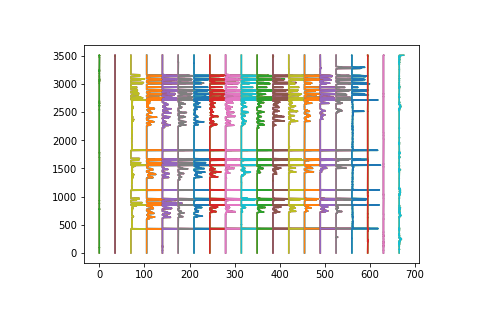

In [107]:
show_hists(hists_1_1)

In [108]:
def chunks_on_image(image, chunks):
    """
    Draw chunks on image
    """
    text_chunks = image.copy()
    n, m, _ = text_chunks.shape
    for i in chunks:
        cv2.line(text_chunks, (i, 0), (i, n),GREEN,3)
    show(text_chunks)

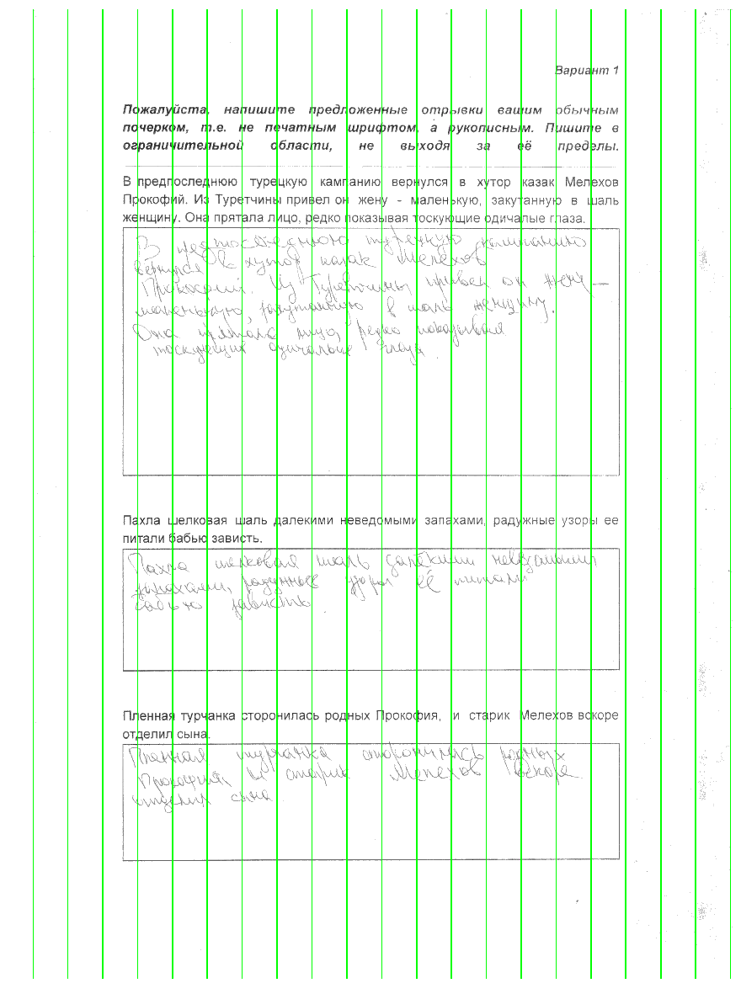

In [109]:
chunks_on_image(img_1_1, get_chunks(img_1_1))

### Он просто разделил мне сейчас листок на 21 часть, причем не по тому измерению
### А еще, возможно, надо это использовать уже для текстовых блоков, а не всего листа

In [128]:
def find_valleys(sm_hists, thresh = 1):
    """
    Поиск впадин на сглаженных гистограммах 
    """
    valleys = []
    interval_average_height = []
    for curr in sm_hists:
        curr[curr < thresh] = 0
        valleys_ind, curr_valley = [], []
        prev = 1
        for i, val in enumerate(curr[:-1]):
            is_zero_val = True
            for el in val:
                if round(el, 0) != 0:
                    is_zero_val = False
            is_zero_curr = True
            for el in curr[i+1]:
                if round(el, 0) != 0:
                    is_zero_curr = False
            
            is_zero_prev = True
            if type(prev) == int:
                if prev != 0:
                    is_zero_prev = False
            else:       
                for el in prev:
                    if round(el, 0) != 0:
                        is_zero_prev = False
            
            if (is_zero_val == True and is_zero_prev == False):
                curr_valley.append(i)
            if (is_zero_val == True and is_zero_curr == False):
                curr_valley.append(i)
            if len(curr_valley) == 2:
                valleys_ind.append(curr_valley)
                interval_average_height.append(curr_valley[1] - curr_valley[0])
                curr_valley = []
            if len(curr_valley) == 1 and (i == len(curr) - 2):
                curr_valley.append(i)
                valleys_ind.append(curr_valley)
            prev = val
        valleys.append(valleys_ind)
    return valleys


In [132]:
sm_hists_1_1 = smooth_hists(hists_1_1)
valleys_1_1 = find_valleys(sm_hists_1_1)

In [133]:
def show_valleys(image, valleys, channels = 3):
    chunks = get_chunks(image, channels)
    img = image.copy()
    for i, y in enumerate(chunks[:-1]):
        for (x_1, x_2) in valleys[i]:
            cv2.line(img, (y, x_1), (chunks[i + 1], x_1),GREEN,3)
            cv2.line(img, (y, x_2), (chunks[i + 1], x_2),RED,3)
    if channels == 3:
        show(img)
    else:
        show_gray(img)

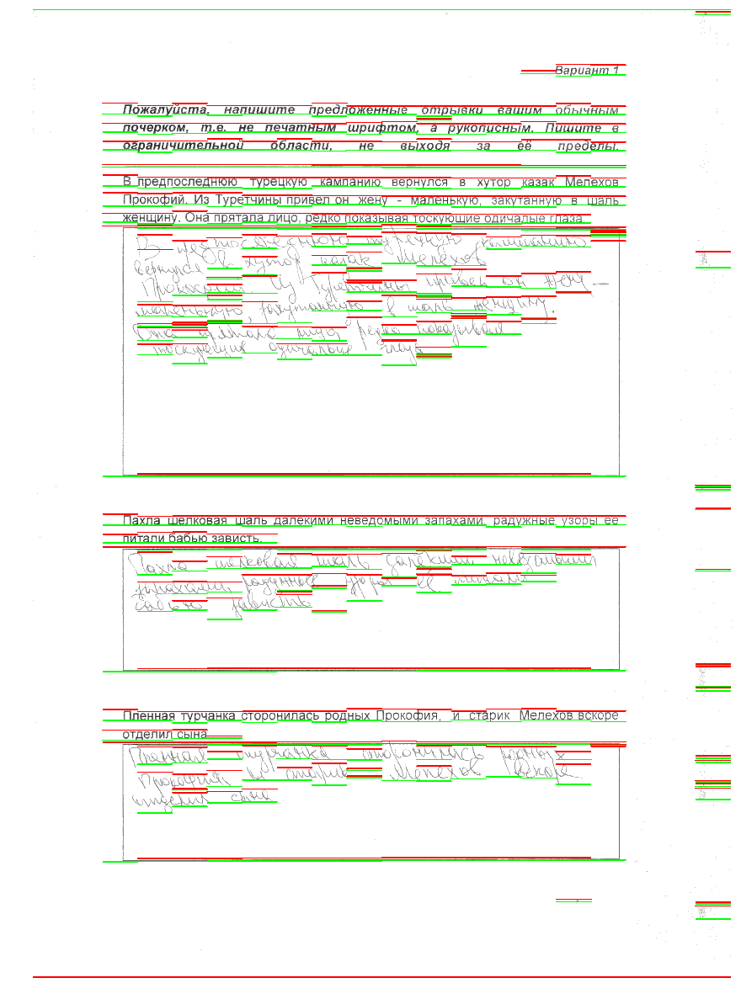

In [134]:
show_valleys(img_1_1, valleys_1_1)

### Воу, энивэй он что-то сделал! И даже смог норм это показать ( +- норм, конечно же)

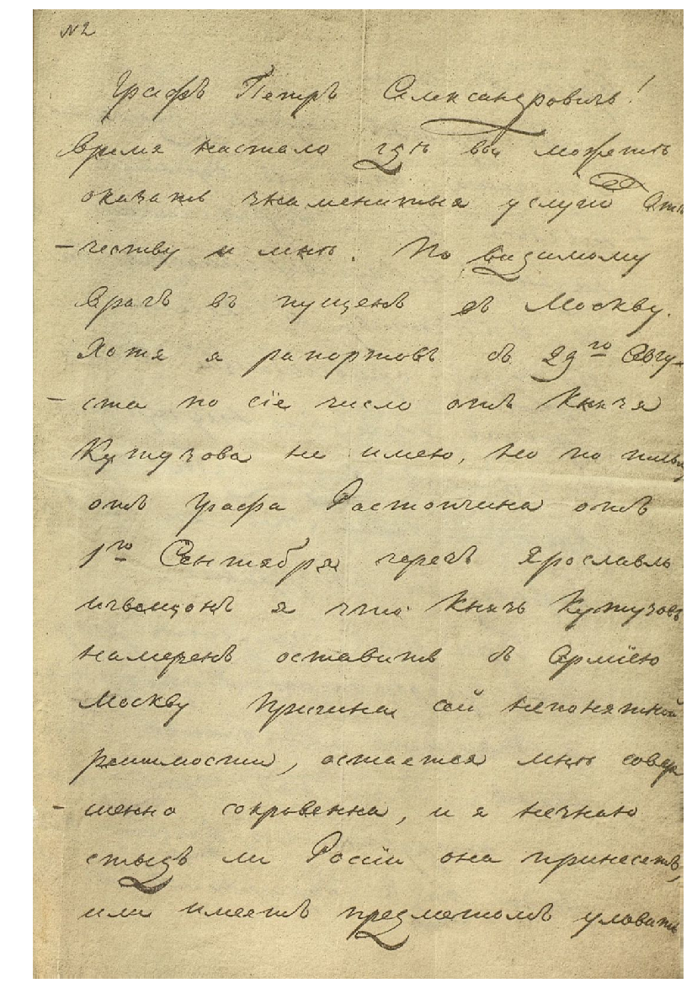

In [153]:
hists_let, black_h_let , white_h_let, count_Lines_let = build_hists(img_let)
sm_hists_let = smooth_hists(hists_let)
valleys_let = find_valleys(sm_hists_let)
show_valleys(img_let, valleys_let)

## А здесь не смог ничего :(

In [144]:
def build_hists(image):
    """
    Build hist to each chunk
    """
    hists = []
    chunks = get_chunks(image)
    black_height = []
    white_height = []
    lines_count = []
    #i - номер итерации, val - значение массива chunks вплоть до предпоследнего элемента
    for i, val in enumerate(chunks[:-1]):
        chunk = image[:, val : chunks[i + 1]]
        hist = np.sum(1 - (chunk / 255), axis=1)
        current_black_height = 0
        current_white_height = 0
        count = 0
        # добавила второе [0], но мне кажется, что это неправильно
        is_zero = True
        for el in hist[0]:
            if round(el, 0) != 0:
                is_zero = False
        if is_zero == True:
        #if hist[0] == 0:
        #if hist[0][0] == 0:
            current_black_height += 1
        else:
            current_white_height += 1
            # добавила второе [0]
        for pix in hist[1:]:
            if pix[0] == 0:
                if current_black_height > 0:
                    current_black_height += 1
                else:
                    current_black_height += 1
                    white_height.append(current_white_height)
                    current_white_height = 0
            else:
                if current_white_height > 0:
                    current_white_height += 1
                else:
                    current_white_height += 1
                    black_height.append(current_black_height)
                    count += 1
                    current_black_height = 0
        lines_count.append(count)
        hists.append(hist)
    return hists, (black_height), (white_height), lines_count


In [145]:
hists_let, black_h_let , white_h_let, count_Lines_let = build_hists(img_let)

In [149]:
count_Lines_let

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [146]:
black_h_let

[]

In [147]:
white_h_let

[]

In [142]:
hists = []
chunks = get_chunks(img_let)
black_height = []
white_height = []
lines_count = []
for i, val in enumerate(chunks[:-1]):
    print('i: ' + str(i))
    print('val: ' + str(val))
    chunk = img_1_1[:, val : chunks[i + 1]]
    hist = np.sum(1 - (chunk / 255), axis=1)
    print('chunk')
    print(chunk)
    print('hist')
    print(hist)
    print('hist[1:]')
    print(hist[1:])
    print('hist[0][0]')
    print(hist[0][0])
    print('hist[0]')
    print(hist[0])
        # добавила второе [0]
    #for pix in hist[1:]:
     #   print('pix[0]')
      #  print(pix[0])
       # print(pix)

i: 0
val: 0
chunk
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [204 204 204]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
hist
[[0.  0.  0. ]
 [0.2 0.2 0.2]
 [0.4 0.4 0.4]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
hist[1:]
[[0.2 0.2 0.2]
 [0.4 0.4 0.4]
 [0.2 0.2 0.2]
 ...
 [0.  0.  0. ]
 [0.  0.  0. ]
 [0.  0.  0. ]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
i: 1
val: 55
chunk
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 

 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
i: 13
val: 715
chunk
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
hist
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[1:]
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
hist[0][0]
0.0
hist[0]
[0. 0. 0.]
i: 14
val: 770
chunk
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 

In [151]:
hists = []
chunks = get_chunks(img_let)
black_height = []
white_height = []
lines_count = []
#i - номер итерации, val - значение массива chunks вплоть до предпоследнего элемента
for i, val in enumerate(chunks[:-1]):
    chunk = img_let[:, val : chunks[i + 1]]
    hist = np.sum(1 - (chunk / 255), axis=1)
    current_black_height = 0
    current_white_height = 0
    count = 0
    # добавила второе [0], но мне кажется, что это неправильно
    is_zero = True
    for el in hist[0]:
        if round(el, 0) != 0:
            is_zero = False
    if is_zero == True:
    #if hist[0] == 0:
    #if hist[0][0] == 0:
        current_black_height += 1
    else:
        current_white_height += 1
        # добавила второе [0]
    for pix in hist[1:]:
        if pix[0] == 0:
            if current_black_height > 0:
                current_black_height += 1
            else:
                current_black_height += 1
                white_height.append(current_white_height)
                current_white_height = 0
        else:
            if current_white_height > 0:
                current_white_height += 1
            else:
                current_white_height += 1
                black_height.append(current_black_height)
                count += 1
                current_black_height = 0
    print(current_black_height)
    print(current_white_height)

0
1647
0
1647
0
1647
0
1647
0
1647
0
1647
0
1647
0
1647
0
1647
0
1647


 Лол. Типа оно само цветное. 
Но я в душе не чаю,  в чем проблема. Он просто не хочет распознавать, что существуют не белые жлементы

In [152]:
def get_chunks(image, channels = 1):
    """
    Split image on chunks, each chunk is 5 percent of image width
    return: array with y-coordinates
    """
    if (channels == 3):
        n, m, _ = image.shape
    else:
        n, m, _ = image.shape
    return np.arange(0, m + 1, m // 20)

In [148]:
lines_

[array([[49.25098039, 31.16470588, 24.89803922],
        [50.02745098, 31.9254902 , 25.65882353],
        [50.56470588, 32.3372549 , 26.07058824],
        ...,
        [49.29411765, 30.56470588, 21.96470588],
        [49.14117647, 30.41176471, 21.81176471],
        [49.01176471, 30.29019608, 21.68627451]]),
 array([[47.44705882, 28.78039216, 22.79607843],
        [47.27058824, 28.60392157, 22.61960784],
        [47.34509804, 28.67843137, 22.69411765],
        ...,
        [48.20392157, 30.00784314, 22.87843137],
        [47.96078431, 29.76470588, 22.63529412],
        [47.77254902, 29.57647059, 22.44705882]]),
 array([[46.78039216, 27.98823529, 22.25490196],
        [47.54901961, 28.75686275, 23.02352941],
        [47.9254902 , 29.13333333, 23.4       ],
        ...,
        [45.90980392, 27.64313725, 21.17254902],
        [45.33333333, 27.06666667, 20.59607843],
        [44.78431373, 26.51764706, 20.04705882]]),
 array([[50.72156863, 31.83529412, 25.60392157],
        [50.20392157, 31

### Короче, не понимаю, в чем причина. Как-то неправильно определяет . 
### Посмотрим, может, вообще не пригодится 

In [154]:
class Trait:
    """
    Класс штрих
    """
    def __init__(self, x_1, x_2, y_1):
        self.x_1 = x_1
        self.x_2 = x_2
        self.y_1 = y_1
        #self.y_2 = y_2
    
    def dist(self, other):
        return ((self.x_2 - other.x_1) ** 2 + (self.y_1 - other.y_1) ** 2) ** (1 / 2)
    
    def print_(self):
        print('x_1: {}  x_2: {}  y: {}'.format(self.x_1, self.x_2, self.y_1))

In [155]:
def get_lines(image, valleys, channels = 3):
    """
    Вычислить среднюю линию в впадине и среднюю высоту строки
    """
    total_lines = []
    chunks = get_chunks(image, channels)
    for i, chunk in enumerate(chunks[:-1]):
        chunk_lines = []
        for val in valleys[i]:
            chunk_lines.append(Trait(chunk, chunks[i+1], sum(val) // len(val)))
        total_lines.append(chunk_lines)
    
    height = []
    for i, line in enumerate(total_lines):
        for j, trait in enumerate(line[:-1]):
            height.append(abs(trait.y_1 - line[j + 1].y_1))
    height = sum(height) / len(height)
    return total_lines, height

In [158]:
lines_1_1 = get_lines(img_1_1, valleys_1_1)

In [173]:
chunks_1_1 = get_chunks(img_1_1, channels = 3)
for i, chunk in enumerate(chunks_1_1[:-1]):
    chunk_lines = []
    for val in valleys_1_1[i]:
        line = Trait(chunk, chunks[i+1], sum(val) // len(val))
        
        print(line.x_1)

0
126
252
252
252
252
252
252
252
252
252
252
252
252
252
252
252
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
378
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
630
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1008
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134


IndexError: index 11 is out of bounds for axis 0 with size 11

In [168]:
for j, trait in enumerate(line[:-1]):
    #print(trait.y_1)
    print(line[j + 1].y_1)

AttributeError: 'list' object has no attribute 'y_1'

In [159]:
def show_lines(image, lines):
    img = image.copy()
    for chunk in lines:
        for line in chunk:
            cv2.line(img, (line.x_1, line.y_1), (line.x_2, line.y_1),GREEN,3)
    show(img)

In [160]:
 show_lines(img_1_1, lines_1_1)

AttributeError: 'list' object has no attribute 'x_1'

# чуть исправить и ок